In [138]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
pd.options.display.max_rows = 999
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

# I. Calculate STAT table

In [4]:
key_word = ['bond', 'Merger', 'Endowment', 'Asset', 'Dissolution']

In [359]:
def countDataByKeyWord(key_word,state_name,boolean_value):
    t_array = []
    for i in key_word:
            try:
                count = state_name[i].value_counts().loc[boolean_value]
            except:
                count = 0
            finally:
                t_array.append(count)
    return t_array

In [365]:
State_data = []
Bond_data = []
Merge_data = [] = []
Endownment_data = []
Asset_data = []
Dissolution_data = []
Bond_data_T = []
Merge_data_T = [] = []
Endownment_data_T = []
Asset_data_T = []
Dissolution_data_T = []
directory = 'C:\\Users\\hangl\\Documents\\Summer RA\\Non-profit\\Statues of States\\Data\\'
entries = os.listdir(directory)
for entry in entries:
    if 'csv' in entry:
        state_name = pd.read_csv(directory + entry)
    elif 'tsv' in entry:
        state_name = pd.read_csv(directory + entry, delimiter="\t")
    else:
        print (false)
    word = entry.split('.')[0]
    State_data.append(word)
    temp_array = countDataByKeyWord(key_word, state_name,False)
    Bond_data.append(temp_array[0])
    Merge_data.append(temp_array[1])
    Endownment_data.append(temp_array[2])
    Asset_data.append(temp_array[3])
    Dissolution_data.append(temp_array[4])
    
    temp_array = countDataByKeyWord(key_word, state_name,True)
    Bond_data_T.append(temp_array[0])
    Merge_data_T.append(temp_array[1])
    Endownment_data_T.append(temp_array[2])
    Asset_data_T.append(temp_array[3])
    Dissolution_data_T.append(temp_array[4])

In [366]:
data = {'State': State_data, 'Bond_False': Bond_data,'Bond_True': Bond_data_T,  'Merger_False': Merge_data,'Merger_True': Merge_data_T, 'Endowment_False': Endownment_data,'Endowment_True': Endownment_data_T, 'Asset_False': Asset_data,'Asset_True': Asset_data_T, 'Dissolution_False': Dissolution_data, 'Dissolution_True': Dissolution_data_T}
df = pd.DataFrame (data, columns = ['State','Bond_False','Bond_True', 'Merger_False','Merger_True', 'Endowment_False','Endowment_True', 'Asset_False','Asset_True', 'Dissolution_False','Dissolution_True'])

In [367]:
df.shape

(50, 11)

In [368]:
df.head()

,State,Bond_False,Bond_True,Merger_False,Merger_True,Endowment_False,Endowment_True,Asset_False,Asset_True,Dissolution_False,Dissolution_True
0,alabama,92,0,85,7,92,0,88,4,83,9
1,alaska,145,2,128,19,147,0,123,24,122,25
2,arizona,577,16,538,55,592,1,534,59,511,82
3,arkansas,25,1,26,0,26,0,23,3,22,4
4,california,207,0,202,5,207,0,202,5,204,3


In [369]:
# Export to csv file
df.to_csv('Stat Data2.csv', index= False)

# II.Wordcloud visualization

In [370]:
!pip install nltk

In [93]:
import nltk

In [94]:
import re
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hangl\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\hangl\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [95]:
stop_words = set(stopwords.words("english"))

In [96]:
from nltk.stem import WordNetLemmatizer
lemma = WordNetLemmatizer()

In [375]:
!pip install wordcloud

In [236]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [350]:
new_stopwords = ['ic', 'p', 'l', 'sec', 'a', 'b', 'c', 'e', 'f', 'g', 'article', 'articles', 'section', 'shall', 'may', 'must', 'ch', 'eff','ii', 'pl', 'also', 'therefor', 'ilcs', 'par', 'dec', 'xa', 'u', 'r', 's']
new_stopwords_list = stop_words.union(new_stopwords)

In [351]:
def fix_Text(text):
	letters_only = re.sub("[^a-zA-Z0-9]"," ", str(text))
	words=letters_only.lower().split()
	meaningful=[lemma.lemmatize(word) for word in words if word not in new_stopwords_list]
	return(" ".join(meaningful))

In [352]:
def fix_Text_wo_number(text):
	letters_only = re.sub("[^a-zA-Z]"," ", str(text))
	words=letters_only.lower().split()
	meaningful=[lemma.lemmatize(word) for word in words if word not in new_stopwords_list]
	return(" ".join(meaningful))

In [226]:
def computeTF(text_wc):
    tfDict = {}
    str_list = text_wc.split() 
    unique_words = set(str_list)
    for words in unique_words : 
        tfDict[words] = str_list.count(words)/len(str_list)
    return tfDict

In [247]:
def printTopWordAllState(key_word):
    directory = 'C:\\Users\\hangl\\Documents\\Summer RA\\Non-profit\\Statues of States\\Data\\'
    entries = os.listdir(directory)
    key_word_df = pd.DataFrame(columns=['Law', key_word])
    for entry in entries:
        if 'csv' in entry:
            state_name = pd.read_csv(directory + entry)
        elif 'tsv' in entry:
            state_name = pd.read_csv(directory + entry, delimiter="\t")
        else:
            print (false)
        state_name = state_name.rename(columns={'4':'Law'})
        key_word_df = key_word_df.append(state_name.loc[state_name[key_word] == True, ['Law', key_word]])
        
    clean_text = key_word_df.Law.apply(fix_Text_wo_number)
    text_wc = " ".join(item for item in clean_text)
    sort_orders = sorted(computeTF(text_wc).items(), key=lambda x: x[1], reverse = True)
    df = pd.DataFrame (sort_orders[:10],columns=['Word', 'Frequency'])
    array = df.Word
    #dict_data.update({word:array})
    for i in sort_orders:
        print(i[0], i[1]) 

In [248]:
printTopWordAllState("Merger")

corporation 0.041444735337486084
merger 0.017525051909361742
state 0.016129517619090608
director 0.012296500255785261
member 0.011468959706298337
act 0.009129276880021667
foreign 0.008613944810568446
name 0.00849357527609762
person 0.008019620234118745
plan 0.007940627727122266
limited 0.007925581535313413
business 0.007846589028316933
law 0.007624657699136349
entity 0.007301164575246005
secretary 0.0069062020402636095
share 0.006868586560741476
added 0.006345731395383828
domestic 0.0062291234088652165
liability 0.006195269477295297
certificate 0.0060259998194456986
board 0.005928199572688152
consolidation 0.005822876230026181
vote 0.005755168366886341
provision 0.0057100297914597815
incorporation 0.005691222051698715
company 0.005631037284463302
amended 0.005570852517227889
surviving 0.00552571394180133
mean 0.005209743913815413
shareholder 0.005209743913815413
right 0.005123228310914507
meeting 0.005093135927296801
filing 0.004807258282928591
partnership 0.0046116577894135
provided 0

enable 0.00012789263037525203
conducting 0.00012789263037525203
acted 0.00012789263037525203
decision 0.00012413108242303873
sum 0.00012413108242303873
rcw 0.00012413108242303873
involved 0.00012413108242303873
family 0.00012413108242303873
equitable 0.00012413108242303873
executing 0.00012413108242303873
circuit 0.00012413108242303873
causing 0.00012413108242303873
promptly 0.00012413108242303873
solicitation 0.00012413108242303873
question 0.00012413108242303873
consist 0.00012413108242303873
bankruptcy 0.00012413108242303873
village 0.00012413108242303873
wind 0.00012413108242303873
duration 0.00012413108242303873
discharge 0.00012036953447082544
residential 0.00012036953447082544
rendered 0.00012036953447082544
amending 0.00012036953447082544
understanding 0.00012036953447082544
investigative 0.00012036953447082544
defendant 0.00012036953447082544
hereinafter 0.00012036953447082544
community 0.00012036953447082544
catastrophic 0.00012036953447082544
cancelled 0.00012036953447082544

origin 4.1377027474346244e-05
residing 4.1377027474346244e-05
branch 4.1377027474346244e-05
tape 4.1377027474346244e-05
vandalism 4.1377027474346244e-05
arbitrative 4.1377027474346244e-05
burden 4.1377027474346244e-05
waive 4.1377027474346244e-05
unissued 4.1377027474346244e-05
employ 4.1377027474346244e-05
eleven 4.1377027474346244e-05
occupation 4.1377027474346244e-05
apart 4.1377027474346244e-05
reduce 4.1377027474346244e-05
nonsurviving 4.1377027474346244e-05
encumbrance 4.1377027474346244e-05
confirmation 4.1377027474346244e-05
fraudulent 4.1377027474346244e-05
renewable 4.1377027474346244e-05
organizing 4.1377027474346244e-05
photocopy 4.1377027474346244e-05
changing 4.1377027474346244e-05
alphabetical 4.1377027474346244e-05
identify 4.1377027474346244e-05
unreasonably 4.1377027474346244e-05
domain 4.1377027474346244e-05
improve 4.1377027474346244e-05
disagreement 4.1377027474346244e-05
legally 4.1377027474346244e-05
insolvency 4.1377027474346244e-05
index 4.1377027474346244e-05


displaced 1.504619180885318e-05
apparently 1.504619180885318e-05
classify 1.504619180885318e-05
cruelty 1.504619180885318e-05
island 1.504619180885318e-05
quality 1.504619180885318e-05
depreciation 1.504619180885318e-05
erie 1.504619180885318e-05
borough 1.504619180885318e-05
supplied 1.504619180885318e-05
combine 1.504619180885318e-05
accrues 1.504619180885318e-05
subchapters 1.504619180885318e-05
examiner 1.504619180885318e-05
varies 1.504619180885318e-05
husband 1.504619180885318e-05
orally 1.504619180885318e-05
sealing 1.504619180885318e-05
much 1.504619180885318e-05
wherein 1.504619180885318e-05
reviewing 1.504619180885318e-05
ink 1.504619180885318e-05
authentication 1.504619180885318e-05
claimed 1.504619180885318e-05
carolina 1.504619180885318e-05
truthfully 1.504619180885318e-05
drill 1.504619180885318e-05
affixing 1.504619180885318e-05
prevail 1.504619180885318e-05
xxx 1.504619180885318e-05
definite 1.504619180885318e-05
foster 1.504619180885318e-05
undivided 1.504619180885318e

developer 3.761547952213295e-06
incorporeal 3.761547952213295e-06
cayuga 3.761547952213295e-06
base 3.761547952213295e-06
minimis 3.761547952213295e-06
veteran 3.761547952213295e-06
explains 3.761547952213295e-06
repealable 3.761547952213295e-06
evaluating 3.761547952213295e-06
postponement 3.761547952213295e-06
naprapathy 3.761547952213295e-06
dickinson 3.761547952213295e-06
ouster 3.761547952213295e-06
dilapidation 3.761547952213295e-06
fortius 3.761547952213295e-06
disapproved 3.761547952213295e-06
attempting 3.761547952213295e-06
restricting 3.761547952213295e-06
disturbance 3.761547952213295e-06
parenthesis 3.761547952213295e-06
perquisite 3.761547952213295e-06
unaffected 3.761547952213295e-06
grass 3.761547952213295e-06
pose 3.761547952213295e-06
rul 3.761547952213295e-06
indifference 3.761547952213295e-06
display 3.761547952213295e-06
unscientific 3.761547952213295e-06
renamed 3.761547952213295e-06
xix 3.761547952213295e-06
stabilize 3.761547952213295e-06
hopewell 3.761547952213

malaysia 3.761547952213295e-06
merchandise 3.761547952213295e-06
furniture 3.761547952213295e-06
persuades 3.761547952213295e-06
china 3.761547952213295e-06
thoroughfare 3.761547952213295e-06
secondary 3.761547952213295e-06
occupy 3.761547952213295e-06
uncorrected 3.761547952213295e-06
amendable 3.761547952213295e-06
graf 3.761547952213295e-06
dishonored 3.761547952213295e-06
staff 3.761547952213295e-06
formulated 3.761547952213295e-06
assures 3.761547952213295e-06
captivity 3.761547952213295e-06
concurred 3.761547952213295e-06
maker 3.761547952213295e-06
lifetime 3.761547952213295e-06
numeric 3.761547952213295e-06
irrevocability 3.761547952213295e-06
examining 3.761547952213295e-06
guam 3.761547952213295e-06
broome 3.761547952213295e-06
earning 3.761547952213295e-06
lacked 3.761547952213295e-06
stabilization 3.761547952213295e-06
engagement 3.761547952213295e-06
suffers 3.761547952213295e-06
demonstrating 3.761547952213295e-06
recertification 3.761547952213295e-06
prohibitory 3.761547

In [120]:
def getTopWordAllState(key_word):
    directory = 'C:\\Users\\hangl\\Documents\\Summer RA\\Non-profit\\Statues of States\\Data\\'
    entries = os.listdir(directory)
    key_word_df = pd.DataFrame(columns=['Law', key_word])
    for entry in entries:
        if 'csv' in entry:
            state_name = pd.read_csv(directory + entry)
        elif 'tsv' in entry:
            state_name = pd.read_csv(directory + entry, delimiter="\t")
        else:
            print (false)
        state_name = state_name.rename(columns={'4':'Law'})
        key_word_df = key_word_df.append(state_name.loc[state_name[key_word] == True, ['Law', key_word]])
        
    clean_text = key_word_df.Law.apply(fix_Text_wo_number)
    text_wc = " ".join(item for item in clean_text)
    sort_orders = sorted(computeTF(text_wc).items(), key=lambda x: x[1], reverse = True)
    df = pd.DataFrame (sort_orders[:10],columns=['Word', 'Frequency'])
    array = df.Word
    return array

In [278]:
def WordCloudAllState(key_word):
    directory = 'C:\\Users\\hangl\\Documents\\Summer RA\\Non-profit\\Statues of States\\Data\\'
    entries = os.listdir(directory)
    key_word_df = pd.DataFrame(columns=['Law', key_word])
    for entry in entries:
        if 'csv' in entry:
            state_name = pd.read_csv(directory + entry)
        elif 'tsv' in entry:
            state_name = pd.read_csv(directory + entry, delimiter="\t")
        else:
            print (false)
        state_name = state_name.rename(columns={'4':'Law'})
        key_word_df = key_word_df.append(state_name.loc[state_name[key_word] == True, ['Law', key_word]])
        
    clean_text = key_word_df.Law.apply(fix_Text_wo_number)
    text_wc = " ".join(item for item in clean_text)
    wordcloud = WordCloud(background_color="black").generate(text_wc)
    plt.figure(figsize = (14, 13))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show() 

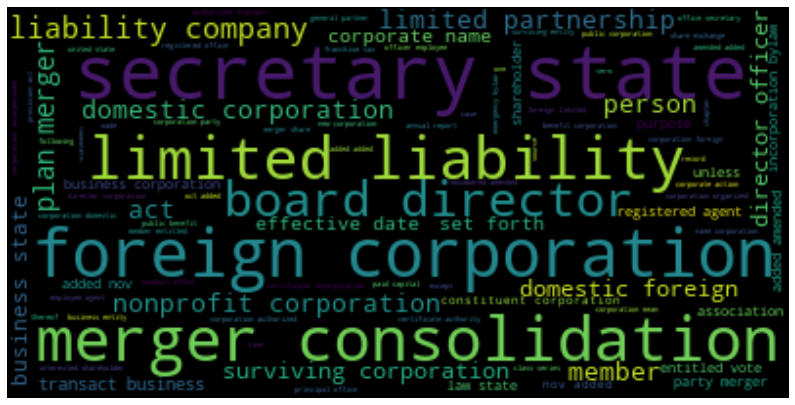

In [279]:
WordCloudAllState("Merger")

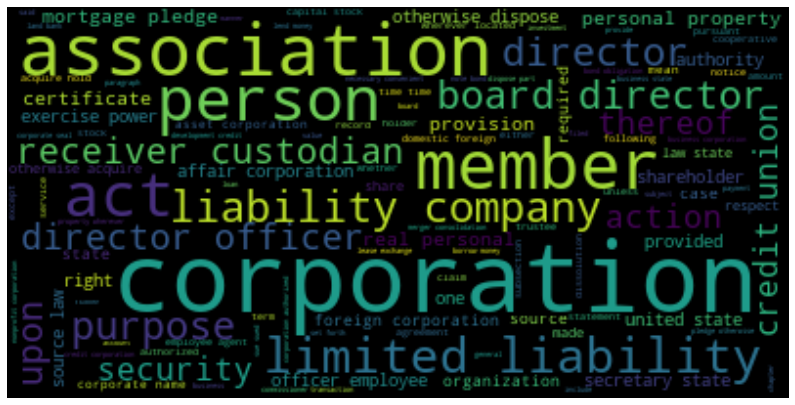

In [267]:
WordCloudAllState("bond")

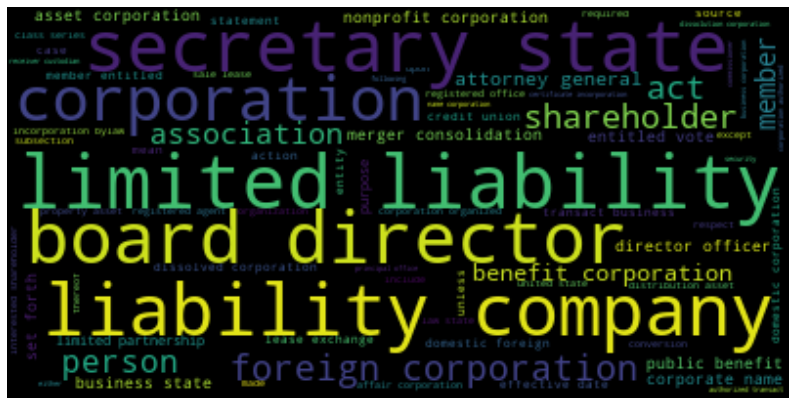

In [268]:
WordCloudAllState("Asset")

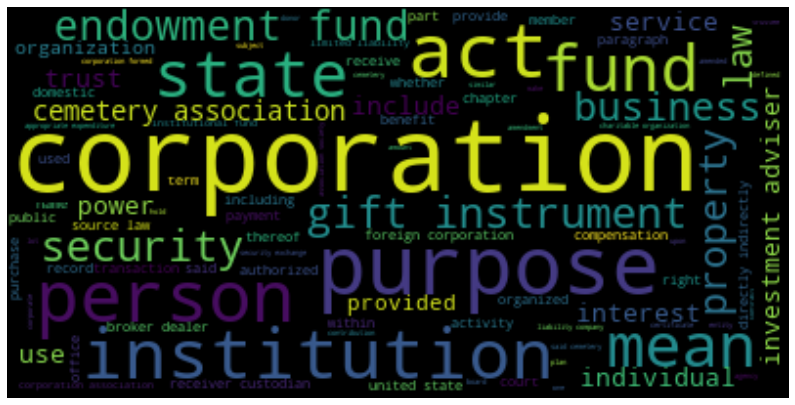

In [269]:
WordCloudAllState("Endowment")

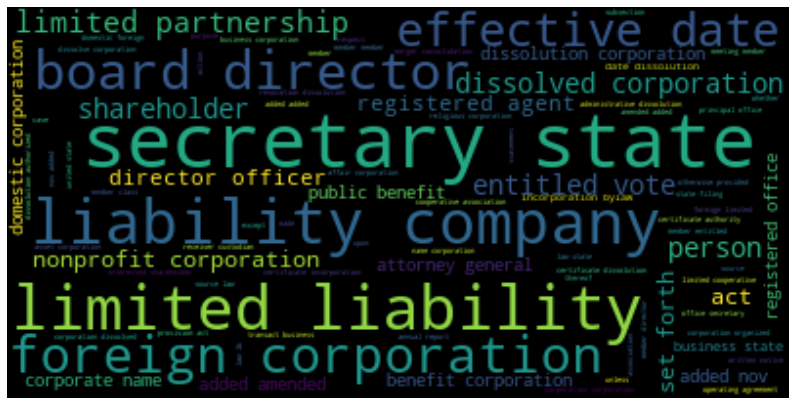

In [280]:
WordCloudAllState("Dissolution")

# III. Correlation

## Merger - All States

In [390]:
def compareTwoStates(state1,state2):
    similarity = set(state1) & set(state2)
    return len(similarity)/10

In [156]:
def getTopTenWordForEachState(key_word):
    directory = 'C:\\Users\\hangl\\Documents\\Summer RA\\Non-profit\\Statues of States\\Data\\'
    entries = os.listdir(directory)
    #df = pd.DataFrame(columns=['State_Name', 'TopTen'])
    dict_data = {}
    sort_orders = {}
    array = []
    for entry in entries:
        if 'csv' in entry:
            state_name = pd.read_csv(directory + entry)
            word = entry.split('.')[0]
        elif 'tsv' in entry:
            state_name = pd.read_csv(directory + entry, delimiter="\t")
            word = entry.split('.')[0]
        else:
            print (false)
        
        state_name = state_name.rename(columns={'4':'Law'})
        state_name = state_name.loc[state_name[key_word] == True, ['Law', key_word]]
        clean_text = state_name.Law.apply(fix_Text_wo_number)
        text_wc = " ".join(item for item in clean_text)
        sort_orders = sorted(computeTF(text_wc).items(), key=lambda x: x[1], reverse = True)
        df = pd.DataFrame (sort_orders[:10],columns=['Word', 'Frequency'])
        array = df.Word
        #df2 = pd.DataFrame([[entry,sort_orders[:10]]], columns=['State_Name', 'TopTen'])
        #df = df.append(df2, ignore_index=True)
        dict_data.update({word:array})
    return dict_data

In [128]:
def createMatrix_1(data,top_ten):
    matrix = np.zeros((50,1))
    i = 0
    for key in data.keys():
        matrix[i][0] = compareTwoStates(data[key],top_ten)
        i=i+1
    return matrix

In [135]:
def plotData_1(key_word):
    import numpy as np
    import matplotlib
    import matplotlib.pyplot as plt

    state_name = []
    for key in dict_data.keys():
        state_name.append(key)


    fig, ax = plt.subplots(figsize=(20,20))
    im = ax.imshow(correlation_matrix)

    # We want to show all ticks...
    ax.set_xticks(np.arange(len(state_name)))
    ax.set_yticks(np.arange(len(state_name)))
    # ... and label them with the respective list entries
    ax.set_xticklabels(state_name)
    ax.set_yticklabels(state_name)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    for i in range(len(state_name)):
        for j in range(len(state_name)):
            text = ax.text(j, i, correlation_matrix[i, j],
                           ha="center", va="center", color="w")

    ax.set_title("Correlation heatmap for all states - " + key_word, fontsize=25)
    fig.tight_layout()
    plt.show()

In [165]:
dict_data = getTopTenWordForEachState("Merger")

In [166]:
print(dict_data)

{'alabama': 0            title
1          january
2        effective
3      transferred
4              act
5        provision
6          section
7         repealed
8           merger
9    consolidation
Name: Word, dtype: object, 'alaska': 0      corporation
1           merger
2    consolidation
3          article
4            state
5           member
6      certificate
7            shall
8             plan
9              may
Name: Word, dtype: object, 'arizona': 0    corporation
1        article
2        section
3           mean
4        chapter
5       director
6          title
7         person
8          share
9         merger
Name: Word, dtype: object, 'arkansas': Series([], Name: Word, dtype: object), 'california': 0    corporation
1      effective
2           mean
3        article
4           date
5     instrument
6          bylaw
7         member
8      specified
9         merger
Name: Word, dtype: object, 'colorado': 0         member
1          right
2          shall
3         o

In [187]:
#compareTwoStatesList = []
#statenameList = []
dict_data_new ={}
for key in dict_data.keys():
        dict_data_new.update({key:compareTwoStates(dict_data[key],top_ten)})
df = pd.DataFrame(list(dict_data_new.items()),columns=['state','correlation'])
print(df)

             state  correlation
0          alabama          0.3
1           alaska          0.7
2          arizona          0.5
3         arkansas          0.0
4       california          0.4
5         colorado          0.3
6      connecticut          0.6
7         delaware          0.5
8          florida          0.3
9          georgia          0.6
10          hawaii          0.7
11           idaho          0.8
12        illinois          0.8
13         indiana          0.6
14            iowa          0.7
15          kansas          0.6
16        kentucky          0.4
17       louisiana          0.7
18           maine          0.6
19        maryland          0.4
20   massachusetts          0.6
21        michigan          0.5
22       minnesota          0.6
23     mississippi          0.8
24        missouri          0.9
25         montana          0.5
26        nebraska          0.7
27          nevada          0.4
28   new-hampshire          0.3
29      new-mexico          0.5
30      

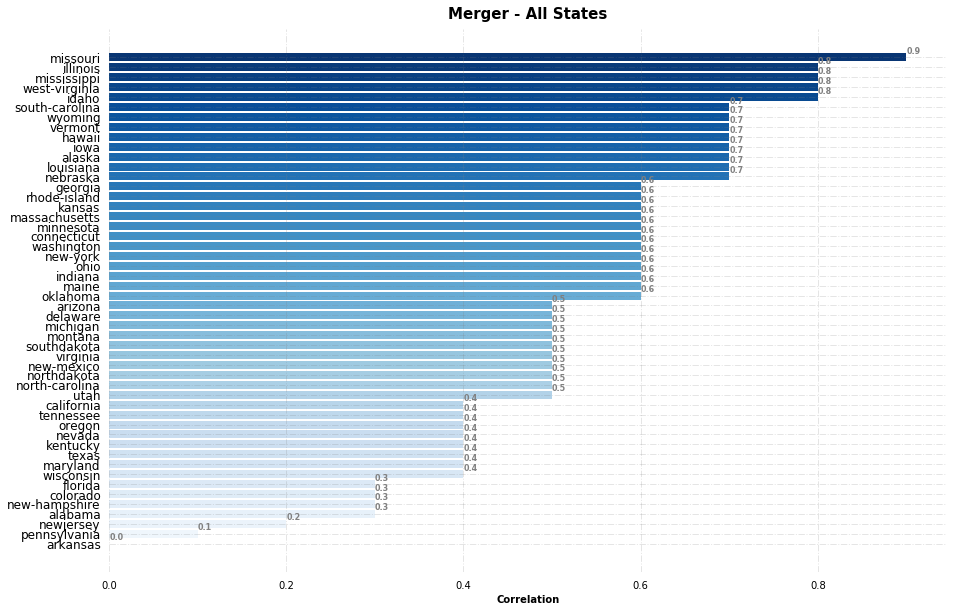

In [207]:
fig, ax = plt.subplots(figsize=(15,10))

# Horizontal Bar Plot

#title_cnt=dt.city.value_counts().sort_values(ascending=False).reset_index()
df.sort_values('correlation',ascending=False, inplace=True)
mn= ax.barh(df.iloc[:,0], df.iloc[:,1], color=sns.color_palette('Blues_r',len(df)))

# Remove axes splines
for s in ['top','bottom','left','right']:
    ax.spines[s].set_visible(False)

# Remove x,y Ticks
ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')

# Add padding between axes and labels
ax.xaxis.set_tick_params(pad=5)
ax.yaxis.set_tick_params(pad=5)

# Add x,y gridlines
ax.grid(b=True, color='grey', linestyle='-.', linewidth=1, alpha=0.2)

# Show top values 
ax.invert_yaxis()

# Add Plot Title
ax.set_title('Merger - All States',weight='bold',
             loc='center', pad=10, fontsize=15)
ax.set_xlabel('Correlation', weight='bold')


# Add annotation to bars
for i in ax.patches:
    ax.text(i.get_width(), i.get_y(), str(round((i.get_width()), 2)),
            fontsize=8, fontweight='bold', color='grey')
plt.yticks(fontsize=12)


plt.show()
# Show Plot
plt.show()

## Bond - All States

In [208]:
printTopWordAllState("bond")

corporation 0.030684888796508002
shall 0.02085065474953232
may 0.016823425483267512
director 0.010795572646019538
state 0.01061369777593016
member 0.010107046352109749
act 0.009262627312409063
court 0.008600083142797756
section 0.008184369154022033
law 0.007339950114321347
association 0.0072360216171274165
property 0.007041155684888796
power 0.006742361255456246
business 0.006547495323217627
bond 0.006170754520889628
otherwise 0.006144772396591145
receiver 0.006131781334441904
company 0.005664103097069217
person 0.005417272916233631
interest 0.0054042818540843895
share 0.005326335481188942
security 0.005326335481188942
liability 0.005287362294741218
article 0.005183433797547287
purpose 0.005131469548950322
officer 0.005105487424651839
board 0.004806692995219289
limited 0.004533880690085221
name 0.004507898565786738
time 0.004235086260652671
provided 0.004092184577011017
asset 0.004079193514861775
right 0.0038453543961754315
upon 0.0038193722718769486
corporate 0.003741425898981501
sour

mutual 0.00016888380794013717
designation 0.00016888380794013717
establishment 0.00016888380794013717
guardian 0.00016888380794013717
relation 0.00016888380794013717
conferred 0.00016888380794013717
representing 0.00016888380794013717
actual 0.00016888380794013717
according 0.00016888380794013717
generation 0.00016888380794013717
named 0.00016888380794013717
conveyed 0.00016888380794013717
earnings 0.00016888380794013717
country 0.00016888380794013717
exclusively 0.00016888380794013717
entire 0.00016888380794013717
executor 0.00016888380794013717
resulting 0.00016888380794013717
custody 0.00016888380794013717
valid 0.00016888380794013717
solely 0.00016888380794013717
acquisition 0.00015589274579089587
managed 0.00015589274579089587
directory 0.00015589274579089587
bona 0.00015589274579089587
sign 0.00015589274579089587
transmit 0.00015589274579089587
june 0.00015589274579089587
calendar 0.00015589274579089587
independent 0.00015589274579089587
found 0.00015589274579089587
evidenced 0.0

venue 3.897318644772397e-05
brokerage 3.897318644772397e-05
li 2.5982124298482642e-05
warranted 2.5982124298482642e-05
temporarily 2.5982124298482642e-05
living 2.5982124298482642e-05
resell 2.5982124298482642e-05
historic 2.5982124298482642e-05
deputy 2.5982124298482642e-05
qualifies 2.5982124298482642e-05
collective 2.5982124298482642e-05
approach 2.5982124298482642e-05
infrastructure 2.5982124298482642e-05
conditionally 2.5982124298482642e-05
copyright 2.5982124298482642e-05
challenged 2.5982124298482642e-05
inapplicable 2.5982124298482642e-05
main 2.5982124298482642e-05
catching 2.5982124298482642e-05
advantageous 2.5982124298482642e-05
involve 2.5982124298482642e-05
inspect 2.5982124298482642e-05
consists 2.5982124298482642e-05
attain 2.5982124298482642e-05
relevant 2.5982124298482642e-05
recites 2.5982124298482642e-05
oct 2.5982124298482642e-05
contraction 2.5982124298482642e-05
counterclaim 2.5982124298482642e-05
shell 2.5982124298482642e-05
inclusive 2.5982124298482642e-05
atte

preferential 1.2991062149241321e-05
mediation 1.2991062149241321e-05
inform 1.2991062149241321e-05
insure 1.2991062149241321e-05
decide 1.2991062149241321e-05
technology 1.2991062149241321e-05
urgently 1.2991062149241321e-05
interwoven 1.2991062149241321e-05
boston 1.2991062149241321e-05
supervising 1.2991062149241321e-05
factor 1.2991062149241321e-05
supersedeas 1.2991062149241321e-05
accessory 1.2991062149241321e-05
tenor 1.2991062149241321e-05
adjustment 1.2991062149241321e-05
shorter 1.2991062149241321e-05
irrevocably 1.2991062149241321e-05
mechanic 1.2991062149241321e-05
initio 1.2991062149241321e-05
participated 1.2991062149241321e-05
go 1.2991062149241321e-05
procuring 1.2991062149241321e-05
declaring 1.2991062149241321e-05
buyer 1.2991062149241321e-05
punishable 1.2991062149241321e-05
automatically 1.2991062149241321e-05
redistricting 1.2991062149241321e-05
incubator 1.2991062149241321e-05
proscribed 1.2991062149241321e-05
worked 1.2991062149241321e-05
exceeds 1.299106214924132

In [209]:
dict_data = getTopTenWordForEachState("bond")

In [210]:
top_ten = getTopWordAllState('bond')

In [211]:
dict_data_new ={}
for key in dict_data.keys():
        dict_data_new.update({key:compareTwoStates(dict_data[key],top_ten)})
df = pd.DataFrame(list(dict_data_new.items()),columns=['state','correlation'])
print(df)

             state  correlation
0          alabama          0.0
1           alaska          0.4
2          arizona          0.5
3         arkansas          0.2
4       california          0.0
5         colorado          0.0
6      connecticut          0.4
7         delaware          0.0
8          florida          0.3
9          georgia          0.5
10          hawaii          0.4
11           idaho          0.2
12        illinois          0.7
13         indiana          0.4
14            iowa          0.4
15          kansas          0.3
16        kentucky          0.0
17       louisiana          0.6
18           maine          0.4
19        maryland          0.3
20   massachusetts          0.4
21        michigan          0.6
22       minnesota          0.2
23     mississippi          0.5
24        missouri          0.4
25         montana          0.4
26        nebraska          0.5
27          nevada          0.5
28   new-hampshire          0.2
29      new-mexico          0.4
30      

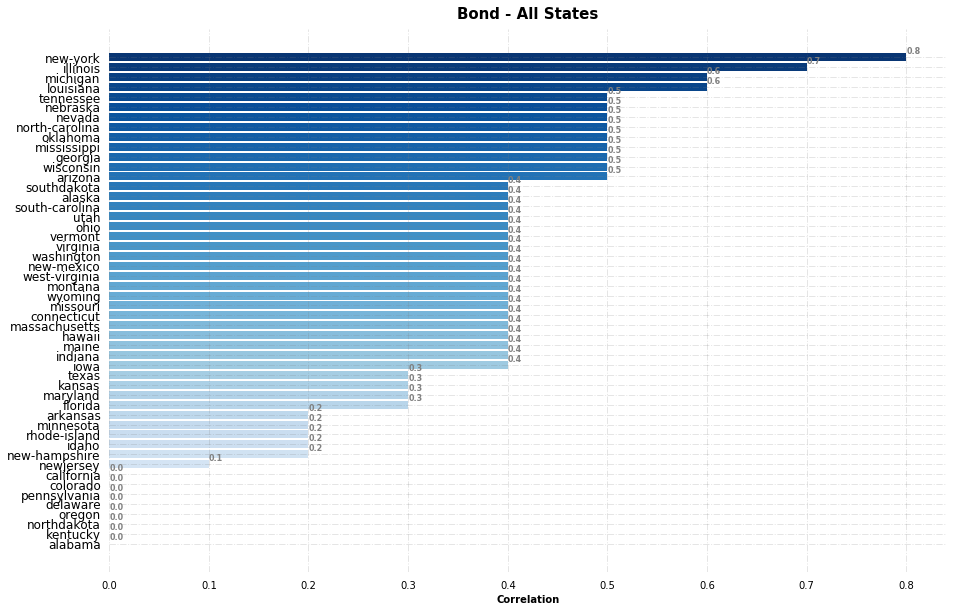

In [212]:
fig, ax = plt.subplots(figsize=(15,10))

# Horizontal Bar Plot

#title_cnt=dt.city.value_counts().sort_values(ascending=False).reset_index()
df.sort_values('correlation',ascending=False, inplace=True)
mn= ax.barh(df.iloc[:,0], df.iloc[:,1], color=sns.color_palette('Blues_r',len(df)))

# Remove axes splines
for s in ['top','bottom','left','right']:
    ax.spines[s].set_visible(False)

# Remove x,y Ticks
ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')

# Add padding between axes and labels
ax.xaxis.set_tick_params(pad=5)
ax.yaxis.set_tick_params(pad=5)

# Add x,y gridlines
ax.grid(b=True, color='grey', linestyle='-.', linewidth=1, alpha=0.2)

# Show top values 
ax.invert_yaxis()

# Add Plot Title
ax.set_title('Bond - All States',weight='bold',
             loc='center', pad=10, fontsize=15)
ax.set_xlabel('Correlation', weight='bold')


# Add annotation to bars
for i in ax.patches:
    ax.text(i.get_width(), i.get_y(), str(round((i.get_width()), 2)),
            fontsize=8, fontweight='bold', color='grey')
plt.yticks(fontsize=12)


plt.show()
# Show Plot
plt.show()

## Endownment  - All States

In [213]:
printTopWordAllState("Endowment")

corporation 0.026439232409381664
shall 0.014818763326226014
fund 0.013113006396588486
may 0.01257995735607676
act 0.01140724946695096
institution 0.010874200426439232
state 0.010767590618336887
purpose 0.010660980810234541
person 0.009275053304904052
association 0.009168443496801706
cemetery 0.009168443496801706
investment 0.008528784648187633
security 0.008208955223880597
law 0.007569296375266524
gift 0.007249466950959489
endowment 0.006716417910447761
mean 0.006716417910447761
section 0.00628997867803838
name 0.0061833688699360345
property 0.005970149253731343
interest 0.005863539445628998
instrument 0.005650319829424307
director 0.005650319829424307
said 0.005543710021321962
business 0.005330490405117271
power 0.004904051172707889
otherwise 0.004904051172707889
court 0.004797441364605544
organization 0.004797441364605544
trustee 0.004797441364605544
term 0.004690831556503198
board 0.004690831556503198
foreign 0.004584221748400853
charitable 0.004584221748400853
authorized 0.00437100

art 0.00010660980810234541
reviewed 0.00010660980810234541
lump 0.00010660980810234541
intention 0.00010660980810234541
learning 0.00010660980810234541
performed 0.00010660980810234541
salary 0.00010660980810234541
clarify 0.00010660980810234541
retained 0.00010660980810234541
indemnification 0.00010660980810234541
explanation 0.00010660980810234541
component 0.00010660980810234541
marine 0.00010660980810234541
financially 0.00010660980810234541
blood 0.00010660980810234541
suggest 0.00010660980810234541
surviving 0.00010660980810234541
arbitration 0.00010660980810234541
taken 0.00010660980810234541
minimum 0.00010660980810234541
becoming 0.00010660980810234541


In [214]:
dict_data = getTopTenWordForEachState("Endowment")

In [215]:
top_ten = getTopWordAllState('Endowment')

In [216]:
dict_data_new ={}
for key in dict_data.keys():
        dict_data_new.update({key:compareTwoStates(dict_data[key],top_ten)})
df = pd.DataFrame(list(dict_data_new.items()),columns=['state','correlation'])
print(df)

             state  correlation
0          alabama          0.0
1           alaska          0.0
2          arizona          0.2
3         arkansas          0.0
4       california          0.0
5         colorado          0.0
6      connecticut          0.0
7         delaware          0.0
8          florida          0.0
9          georgia          0.3
10          hawaii          0.0
11           idaho          0.0
12        illinois          0.3
13         indiana          0.2
14            iowa          0.0
15          kansas          0.0
16        kentucky          0.2
17       louisiana          0.2
18           maine          0.0
19        maryland          0.0
20   massachusetts          0.0
21        michigan          0.3
22       minnesota          0.4
23     mississippi          0.0
24        missouri          0.0
25         montana          0.0
26        nebraska          0.4
27          nevada          0.0
28   new-hampshire          0.0
29      new-mexico          0.0
30      

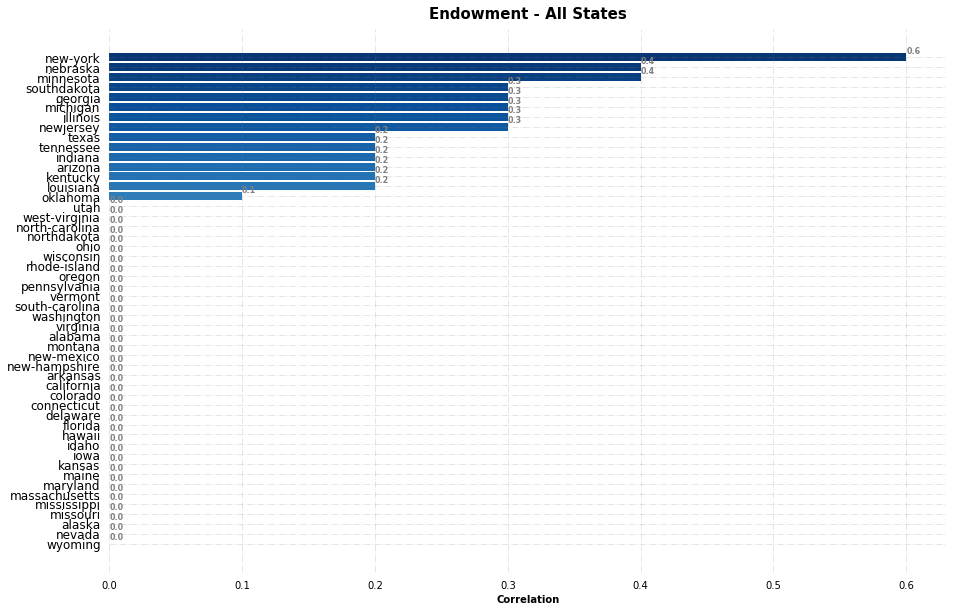

In [217]:
fig, ax = plt.subplots(figsize=(15,10))

# Horizontal Bar Plot

#title_cnt=dt.city.value_counts().sort_values(ascending=False).reset_index()
df.sort_values('correlation',ascending=False, inplace=True)
mn= ax.barh(df.iloc[:,0], df.iloc[:,1], color=sns.color_palette('Blues_r',len(df)))

# Remove axes splines
for s in ['top','bottom','left','right']:
    ax.spines[s].set_visible(False)

# Remove x,y Ticks
ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')

# Add padding between axes and labels
ax.xaxis.set_tick_params(pad=5)
ax.yaxis.set_tick_params(pad=5)

# Add x,y gridlines
ax.grid(b=True, color='grey', linestyle='-.', linewidth=1, alpha=0.2)

# Show top values 
ax.invert_yaxis()

# Add Plot Title
ax.set_title('Endowment - All States',weight='bold',
             loc='center', pad=10, fontsize=15)
ax.set_xlabel('Correlation', weight='bold')


# Add annotation to bars
for i in ax.patches:
    ax.text(i.get_width(), i.get_y(), str(round((i.get_width()), 2)),
            fontsize=8, fontweight='bold', color='grey')
plt.yticks(fontsize=12)


plt.show()
# Show Plot
plt.show()

## Asset - All States

In [218]:
printTopWordAllState("Asset")

corporation 0.039086225901513956
shall 0.019998650259824984
may 0.014288499463853209
member 0.013291191445646713
section 0.012935010010572965
state 0.012571330018971347
director 0.011832722200976312
asset 0.009553161016504323
act 0.008068446823986383
article 0.007296095501615939
person 0.006962409736125796
dissolution 0.00684993138820777
share 0.006823686440360231
liability 0.006673715309802863
business 0.006482502118342219
name 0.006445009335702877
court 0.006092577178893063
law 0.00603633800493405
limited 0.006002594500558642
board 0.005593923169789816
notice 0.005406459256593106
company 0.00536521719568983
shareholder 0.00533897224784229
right 0.005331473691314422
vote 0.005308978021730817
purpose 0.005140260499853778
provision 0.004607862986375123
meeting 0.004555373090680044
upon 0.004484136803665295
incorporation 0.004364159899219401
subsection 0.004307920725260387
property 0.004210439490398099
action 0.004154200316439085
foreign 0.004097961142480073
secretary 0.00403797269025712

instrumentality 9.373195659835481e-05
debenture 9.373195659835481e-05
inspector 9.373195659835481e-05
asserted 9.373195659835481e-05
profession 9.373195659835481e-05
commence 9.373195659835481e-05
desire 9.373195659835481e-05
accountant 9.373195659835481e-05
fifteen 9.373195659835481e-05
irrespective 9.373195659835481e-05
express 9.373195659835481e-05
tender 9.373195659835481e-05
successive 9.373195659835481e-05
admission 9.373195659835481e-05
attached 9.373195659835481e-05
senior 9.373195659835481e-05
mbca 9.373195659835481e-05
severally 9.373195659835481e-05
identified 9.373195659835481e-05
march 9.373195659835481e-05
specifying 9.373195659835481e-05
performed 9.373195659835481e-05
managed 8.998267833442062e-05
main 8.998267833442062e-05
encumbrance 8.998267833442062e-05
insofar 8.998267833442062e-05
unauthorized 8.998267833442062e-05
church 8.998267833442062e-05
sole 8.998267833442062e-05
complying 8.998267833442062e-05
selection 8.998267833442062e-05
regardless 8.998267833442062e-0

accepting 2.624494784753935e-05
invalidate 2.624494784753935e-05
convicted 2.624494784753935e-05
perceivable 2.624494784753935e-05
monitor 2.624494784753935e-05
altering 2.624494784753935e-05
reject 2.624494784753935e-05
referring 2.624494784753935e-05
promoting 2.624494784753935e-05
brokerage 2.624494784753935e-05
overall 2.624494784753935e-05
much 2.624494784753935e-05
nonpayment 2.624494784753935e-05
inclusion 2.624494784753935e-05
investigatory 2.624494784753935e-05
indication 2.624494784753935e-05
telegram 2.624494784753935e-05
monthly 2.624494784753935e-05
punctuation 2.624494784753935e-05
continuously 2.624494784753935e-05
disposal 2.624494784753935e-05
oral 2.624494784753935e-05
adjudication 2.624494784753935e-05
retrievable 2.624494784753935e-05
prejudice 2.624494784753935e-05
lending 2.624494784753935e-05
deficiency 2.624494784753935e-05
physician 2.624494784753935e-05
rescind 2.624494784753935e-05
grouping 2.624494784753935e-05
leased 2.624494784753935e-05
heard 2.6244947847

invalidating 7.498556527868385e-06
suing 7.498556527868385e-06
secondary 7.498556527868385e-06
mandamus 7.498556527868385e-06
attempting 7.498556527868385e-06
inadequate 7.498556527868385e-06
guard 7.498556527868385e-06
allocational 7.498556527868385e-06
contendere 7.498556527868385e-06
realized 7.498556527868385e-06
leasing 7.498556527868385e-06
absolute 7.498556527868385e-06
alphabet 7.498556527868385e-06
investigate 7.498556527868385e-06
gathering 7.498556527868385e-06
replacement 7.498556527868385e-06
deleting 7.498556527868385e-06
transmittal 7.498556527868385e-06
exhaust 7.498556527868385e-06
differing 7.498556527868385e-06
desiring 7.498556527868385e-06
disallowance 7.498556527868385e-06
arabic 7.498556527868385e-06
verba 7.498556527868385e-06
relies 7.498556527868385e-06
pursuance 7.498556527868385e-06
extending 7.498556527868385e-06
integrate 7.498556527868385e-06
acquirer 7.498556527868385e-06
elector 7.498556527868385e-06
disabled 7.498556527868385e-06
undischarged 7.4985565

appealable 3.7492782639341925e-06
disregarded 3.7492782639341925e-06
pre 3.7492782639341925e-06
electrification 3.7492782639341925e-06
correspondence 3.7492782639341925e-06
bookkeeping 3.7492782639341925e-06
nonshareholders 3.7492782639341925e-06
equipping 3.7492782639341925e-06
protective 3.7492782639341925e-06
japan 3.7492782639341925e-06
montana 3.7492782639341925e-06
gl 3.7492782639341925e-06
propaganda 3.7492782639341925e-06
businessmen 3.7492782639341925e-06
encouraged 3.7492782639341925e-06
supercede 3.7492782639341925e-06
territorial 3.7492782639341925e-06
transferability 3.7492782639341925e-06
retrieved 3.7492782639341925e-06
stabilize 3.7492782639341925e-06
georgia 3.7492782639341925e-06
podiatry 3.7492782639341925e-06
underlining 3.7492782639341925e-06
subpt 3.7492782639341925e-06
forbidden 3.7492782639341925e-06
discussed 3.7492782639341925e-06
sea 3.7492782639341925e-06
drawn 3.7492782639341925e-06
honest 3.7492782639341925e-06
heritable 3.7492782639341925e-06
working 3.74

In [219]:
dict_data = getTopTenWordForEachState("Asset")
top_ten = getTopWordAllState('Asset')
dict_data_new ={}
for key in dict_data.keys():
        dict_data_new.update({key:compareTwoStates(dict_data[key],top_ten)})
df = pd.DataFrame(list(dict_data_new.items()),columns=['state','correlation'])
print(df)

             state  correlation
0          alabama          0.3
1           alaska          0.7
2          arizona          0.7
3         arkansas          0.4
4       california          0.5
5         colorado          0.0
6      connecticut          0.7
7         delaware          0.2
8          florida          0.6
9          georgia          0.6
10          hawaii          0.8
11           idaho          0.6
12        illinois          0.8
13         indiana          0.6
14            iowa          0.8
15          kansas          0.3
16        kentucky          0.6
17       louisiana          0.7
18           maine          0.6
19        maryland          0.6
20   massachusetts          0.3
21        michigan          0.5
22       minnesota          0.6
23     mississippi          0.8
24        missouri          0.6
25         montana          0.6
26        nebraska          0.7
27          nevada          0.6
28   new-hampshire          0.5
29      new-mexico          0.7
30      

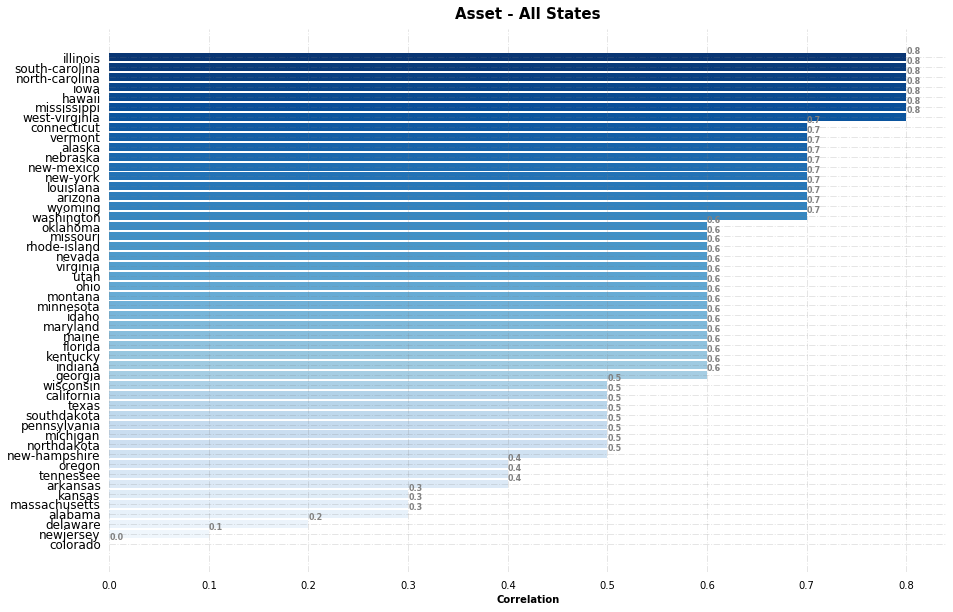

In [220]:
fig, ax = plt.subplots(figsize=(15,10))

# Horizontal Bar Plot

#title_cnt=dt.city.value_counts().sort_values(ascending=False).reset_index()
df.sort_values('correlation',ascending=False, inplace=True)
mn= ax.barh(df.iloc[:,0], df.iloc[:,1], color=sns.color_palette('Blues_r',len(df)))

# Remove axes splines
for s in ['top','bottom','left','right']:
    ax.spines[s].set_visible(False)

# Remove x,y Ticks
ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')

# Add padding between axes and labels
ax.xaxis.set_tick_params(pad=5)
ax.yaxis.set_tick_params(pad=5)

# Add x,y gridlines
ax.grid(b=True, color='grey', linestyle='-.', linewidth=1, alpha=0.2)

# Show top values 
ax.invert_yaxis()

# Add Plot Title
ax.set_title('Asset - All States',weight='bold',
             loc='center', pad=10, fontsize=15)
ax.set_xlabel('Correlation', weight='bold')


# Add annotation to bars
for i in ax.patches:
    ax.text(i.get_width(), i.get_y(), str(round((i.get_width()), 2)),
            fontsize=8, fontweight='bold', color='grey')
plt.yticks(fontsize=12)


plt.show()
# Show Plot
plt.show()

## Dissolution  - All States

In [222]:
printTopWordAllState("Dissolution")

corporation 0.03832997079981717
shall 0.019328017327964925
state 0.014667050956211371
section 0.013665569112436715
may 0.013662657828007138
member 0.013473424340084602
dissolution 0.012728135526112766
director 0.010201140641239509
act 0.009115231549007107
article 0.009045360722697246
limited 0.007449976855288785
secretary 0.007394662451126813
person 0.0071268242836056836
liability 0.006695954188028216
certificate 0.006075850604528212
notice 0.006026358769225394
company 0.006026358769225394
name 0.00599724592492962
court 0.005924463814190183
date 0.005714851335260604
business 0.005706117481971871
law 0.005677004637676096
vote 0.005115126742767642
added 0.005071457476323979
incorporation 0.004949183530281725
asset 0.004789062886654963
board 0.004754127473500034
shareholder 0.004725014629204259
provision 0.004660966371753554
foreign 0.004620208389739469
class 0.004559071416718342
share 0.0045386924257113
subsection 0.004529958572422567
filing 0.004396039488662002
office 0.0043727492132253

ordinary 0.00011354009275352193
furnished 0.00011354009275352193
know 0.00011354009275352193
economic 0.00011354009275352193
proceed 0.00011354009275352193
burial 0.00011354009275352193
nrs 0.00011354009275352193
direction 0.00011354009275352193
et 0.00011354009275352193
seq 0.00011354009275352193
promptly 0.00011354009275352193
nebraska 0.00011354009275352193
involuntarily 0.00011354009275352193
work 0.00011354009275352193
indicate 0.00011354009275352193
substituted 0.00011062880832394444
eleemosynary 0.00011062880832394444
register 0.00011062880832394444
transacting 0.00011062880832394444
succession 0.00011062880832394444
satisfactory 0.00011062880832394444
recommend 0.00011062880832394444
content 0.00011062880832394444
u 0.00011062880832394444
sub 0.00011062880832394444
enforcement 0.00011062880832394444
principle 0.00011062880832394444
render 0.00011062880832394444
unsatisfied 0.00011062880832394444
caused 0.00011062880832394444
recorded 0.00011062880832394444
thereupon 0.000110628

authorizes 3.493541315492982e-05
fire 3.493541315492982e-05
ancillary 3.493541315492982e-05
repealing 3.493541315492982e-05
attach 3.493541315492982e-05
legitimate 3.493541315492982e-05
evenly 3.493541315492982e-05
monies 3.493541315492982e-05
user 3.493541315492982e-05
affiliated 3.493541315492982e-05
mentioned 3.493541315492982e-05
bill 3.493541315492982e-05
foreclosed 3.493541315492982e-05
scope 3.493541315492982e-05
custodial 3.493541315492982e-05
regularly 3.493541315492982e-05
chartered 3.493541315492982e-05
personnel 3.493541315492982e-05
divisible 3.493541315492982e-05
licensee 3.493541315492982e-05
marriage 3.493541315492982e-05
subpart 3.493541315492982e-05
creating 3.493541315492982e-05
ordinance 3.493541315492982e-05
define 3.493541315492982e-05
severability 3.493541315492982e-05
reg 3.493541315492982e-05
prepaid 3.493541315492982e-05
appraiser 3.493541315492982e-05
depositor 3.493541315492982e-05
defending 3.493541315492982e-05
automatically 3.493541315492982e-05
dental 3.

unliquidated 1.4556422147887426e-05
perpetually 1.4556422147887426e-05
ix 1.4556422147887426e-05
enlarged 1.4556422147887426e-05
financially 1.4556422147887426e-05
impending 1.164513771830994e-05
historic 1.164513771830994e-05
collective 1.164513771830994e-05
enacts 1.164513771830994e-05
appellate 1.164513771830994e-05
assuming 1.164513771830994e-05
nmca 1.164513771830994e-05
disputed 1.164513771830994e-05
decreased 1.164513771830994e-05
functioning 1.164513771830994e-05
chicago 1.164513771830994e-05
frustrated 1.164513771830994e-05
investigative 1.164513771830994e-05
inheritance 1.164513771830994e-05
alphabet 1.164513771830994e-05
gasoline 1.164513771830994e-05
attack 1.164513771830994e-05
transmittal 1.164513771830994e-05
distinguished 1.164513771830994e-05
premium 1.164513771830994e-05
redefined 1.164513771830994e-05
notation 1.164513771830994e-05
arabic 1.164513771830994e-05
raised 1.164513771830994e-05
handled 1.164513771830994e-05
possessing 1.164513771830994e-05
claiming 1.16451

reflects 5.82256885915497e-06
testament 5.82256885915497e-06
intact 5.82256885915497e-06
alike 5.82256885915497e-06
suggest 5.82256885915497e-06
repaid 5.82256885915497e-06
inside 5.82256885915497e-06
sunday 5.82256885915497e-06
restitution 5.82256885915497e-06
committing 5.82256885915497e-06
east 5.82256885915497e-06
rewrote 5.82256885915497e-06
extortion 5.82256885915497e-06
hereinbefore 5.82256885915497e-06
franklin 5.82256885915497e-06
compulsory 5.82256885915497e-06
concludes 5.82256885915497e-06
violent 5.82256885915497e-06
idle 5.82256885915497e-06
encouraging 5.82256885915497e-06
understood 5.82256885915497e-06
erroneous 5.82256885915497e-06
reversed 5.82256885915497e-06
additionally 5.82256885915497e-06
unassigned 5.82256885915497e-06
structural 5.82256885915497e-06
tenure 5.82256885915497e-06
elevator 5.82256885915497e-06
superseding 5.82256885915497e-06
reviving 5.82256885915497e-06
punctuation 5.82256885915497e-06
proximity 5.82256885915497e-06
depositing 5.82256885915497e-

always 2.911284429577485e-06
exlude 2.911284429577485e-06
xxvii 2.911284429577485e-06
lawn 2.911284429577485e-06
biogas 2.911284429577485e-06
manufactured 2.911284429577485e-06
intercept 2.911284429577485e-06
township 2.911284429577485e-06
reopened 2.911284429577485e-06
better 2.911284429577485e-06
maliciously 2.911284429577485e-06
separation 2.911284429577485e-06
subjected 2.911284429577485e-06
unenforceable 2.911284429577485e-06
recruitment 2.911284429577485e-06
unscientific 2.911284429577485e-06
electricity 2.911284429577485e-06
relinquish 2.911284429577485e-06
valuable 2.911284429577485e-06
endangering 2.911284429577485e-06
incumber 2.911284429577485e-06
deduct 2.911284429577485e-06
islander 2.911284429577485e-06
guideline 2.911284429577485e-06
cy 2.911284429577485e-06
dar 2.911284429577485e-06
lienors 2.911284429577485e-06
intern 2.911284429577485e-06
recklessness 2.911284429577485e-06
registrar 2.911284429577485e-06
reorganizing 2.911284429577485e-06
xxviii 2.911284429577485e-06


In [223]:
dict_data = getTopTenWordForEachState("Dissolution")
top_ten = getTopWordAllState('Dissolution')
dict_data_new ={}
for key in dict_data.keys():
        dict_data_new.update({key:compareTwoStates(dict_data[key],top_ten)})
df = pd.DataFrame(list(dict_data_new.items()),columns=['state','correlation'])
print(df)

             state  correlation
0          alabama          0.3
1           alaska          0.7
2          arizona          0.5
3         arkansas          0.5
4       california          0.4
5         colorado          0.2
6      connecticut          0.8
7         delaware          0.4
8          florida          0.4
9          georgia          0.8
10          hawaii          0.8
11           idaho          0.7
12        illinois          0.6
13         indiana          0.6
14            iowa          0.9
15          kansas          0.5
16        kentucky          0.5
17       louisiana          0.8
18           maine          0.5
19        maryland          0.6
20   massachusetts          0.6
21        michigan          0.7
22       minnesota          0.5
23     mississippi          0.9
24        missouri          0.7
25         montana          0.7
26        nebraska          0.6
27          nevada          0.6
28   new-hampshire          0.5
29      new-mexico          0.7
30      

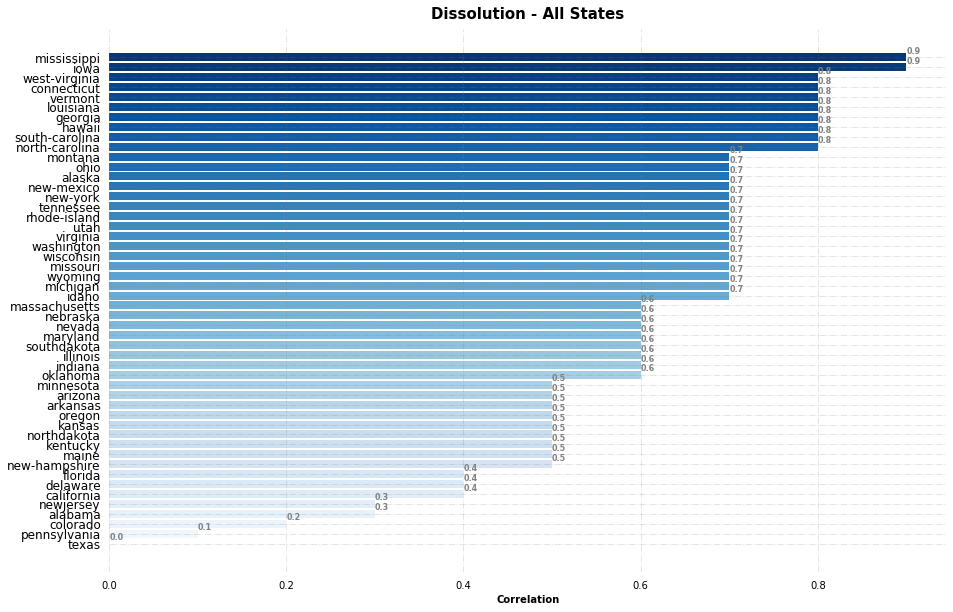

In [224]:
fig, ax = plt.subplots(figsize=(15,10))

# Horizontal Bar Plot

#title_cnt=dt.city.value_counts().sort_values(ascending=False).reset_index()
df.sort_values('correlation',ascending=False, inplace=True)
mn= ax.barh(df.iloc[:,0], df.iloc[:,1], color=sns.color_palette('Blues_r',len(df)))

# Remove axes splines
for s in ['top','bottom','left','right']:
    ax.spines[s].set_visible(False)

# Remove x,y Ticks
ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')

# Add padding between axes and labels
ax.xaxis.set_tick_params(pad=5)
ax.yaxis.set_tick_params(pad=5)

# Add x,y gridlines
ax.grid(b=True, color='grey', linestyle='-.', linewidth=1, alpha=0.2)

# Show top values 
ax.invert_yaxis()

# Add Plot Title
ax.set_title('Dissolution - All States',weight='bold',
             loc='center', pad=10, fontsize=15)
ax.set_xlabel('Correlation', weight='bold')


# Add annotation to bars
for i in ax.patches:
    ax.text(i.get_width(), i.get_y(), str(round((i.get_width()), 2)),
            fontsize=8, fontweight='bold', color='grey')
plt.yticks(fontsize=12)


plt.show()
# Show Plot
plt.show()

In [ ]:
#compareTwoStatesList = []
#statenameList = []
dict_data_new ={}
for key in dict_data.keys():
        dict_data_new.update({key:compareTwoStates(dict_data[key],top_ten)})
df = pd.DataFrame(list(dict_data_new.items()),columns=['state','correlation'])
print(df)

In [414]:
def createMatrix(data):
    matrix = np.zeros((50,50))
    i = 0
    j = 0
    for key in data.keys():
        for key1 in data.keys():
                matrix[i][j] = compareTwoStates(data[key],data[key1])
                j = j + 1
        i=i+1
        j=0
    return matrix

In [131]:
def plotData(key_word):
    import numpy as np
    import matplotlib
    import matplotlib.pyplot as plt

    state_name = []
    for key in dict_data.keys():
        state_name.append(key)


    fig, ax = plt.subplots(figsize=(20,20))
    im = ax.imshow(correlation_matrix)

    # We want to show all ticks...
    ax.set_xticks(np.arange(len(state_name)))
    ax.set_yticks(np.arange(len(state_name)))
    # ... and label them with the respective list entries
    ax.set_xticklabels(state_name)
    ax.set_yticklabels(state_name)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    for i in range(len(state_name)):
        for j in range(len(state_name)):
            text = ax.text(j, i, correlation_matrix[i, j],
                           ha="center", va="center", color="w")

    ax.set_title("Correlation heatmap for all states - " + key_word, fontsize=25)
    fig.tight_layout()
    plt.show()

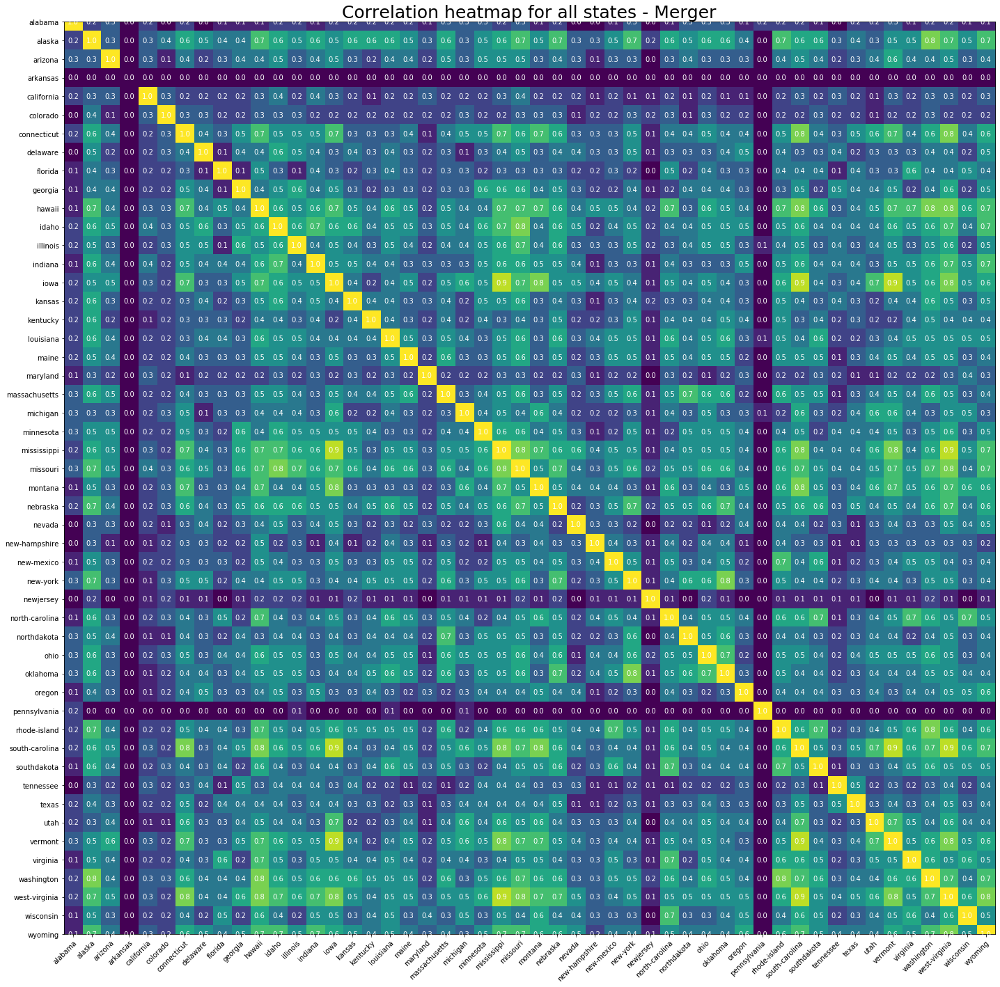

In [423]:
dict_data = getTopTenWordForEachState("Merger")
correlation_matrix = createMatrix(dict_data)
plotData("Merger")

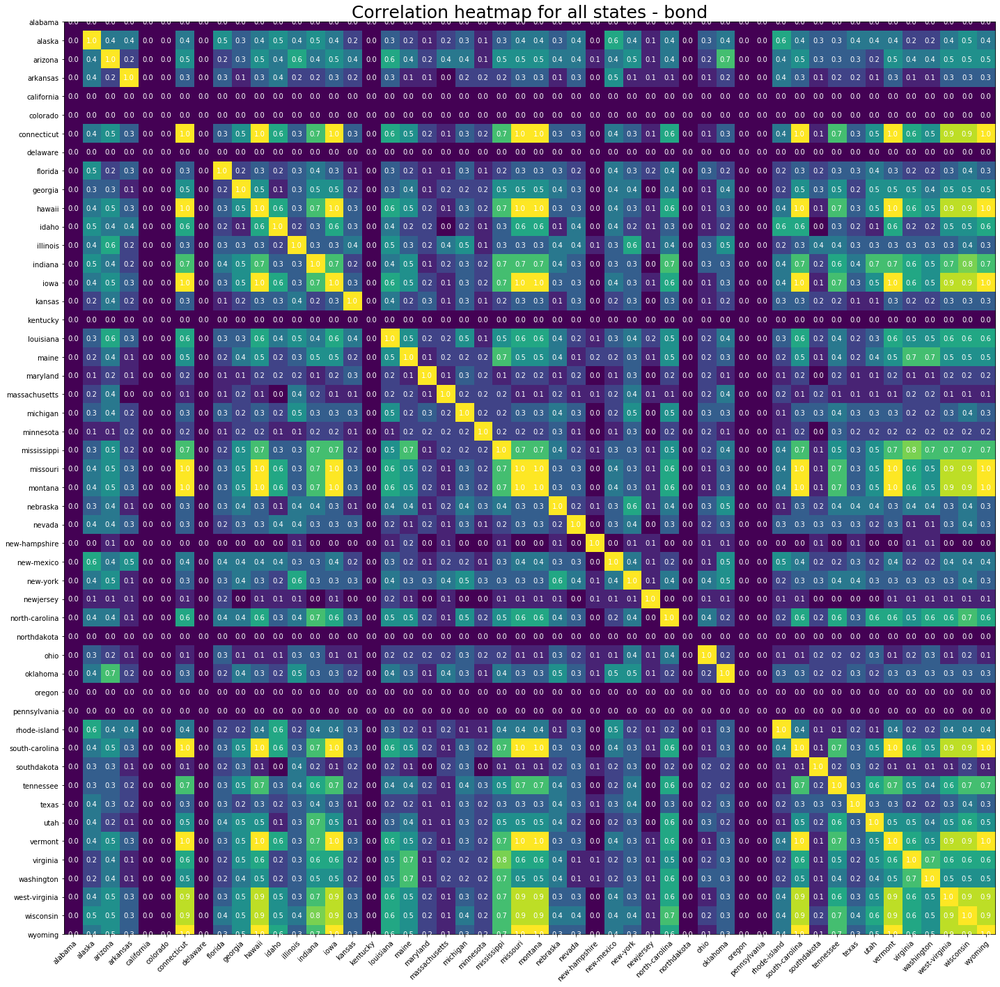

In [424]:
dict_data = getTopTenWordForEachState("bond")
correlation_matrix = createMatrix(dict_data)
plotData('bond')

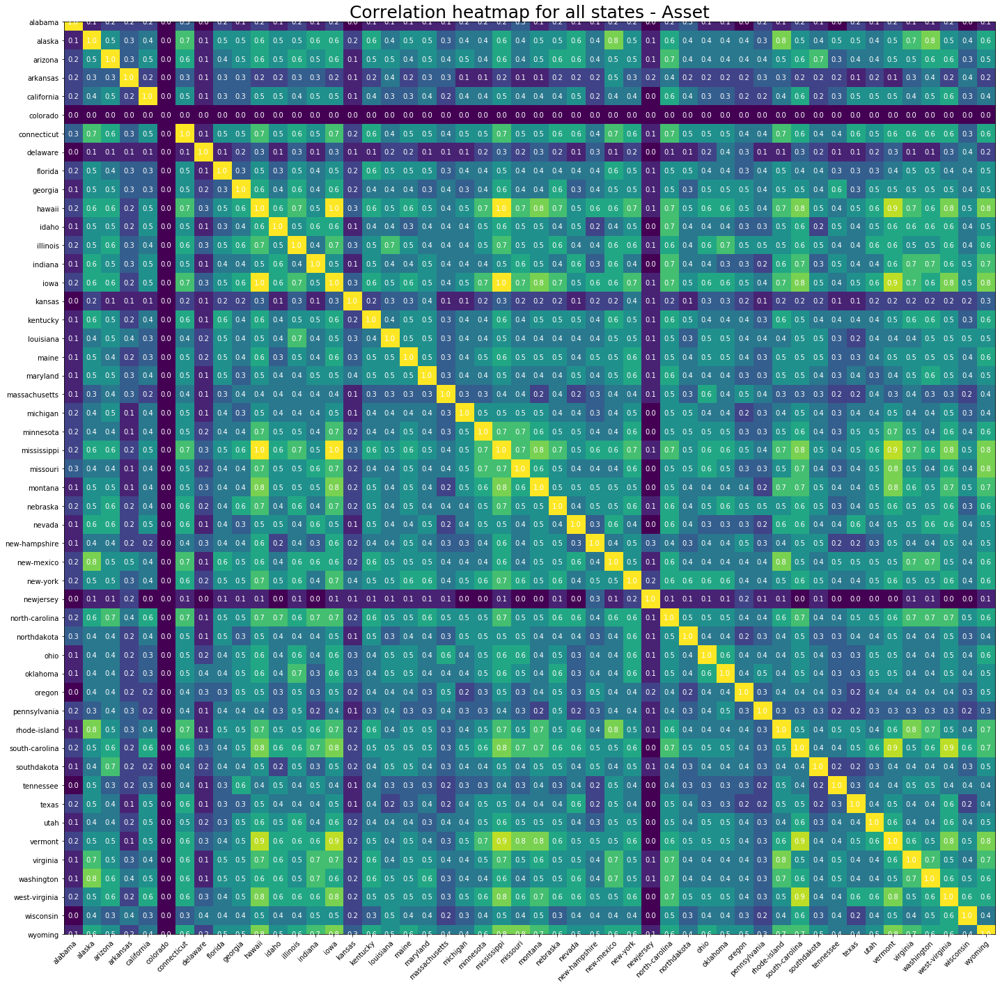

In [425]:
dict_data = getTopTenWordForEachState("Asset")
correlation_matrix = createMatrix(dict_data)
plotData('Asset')

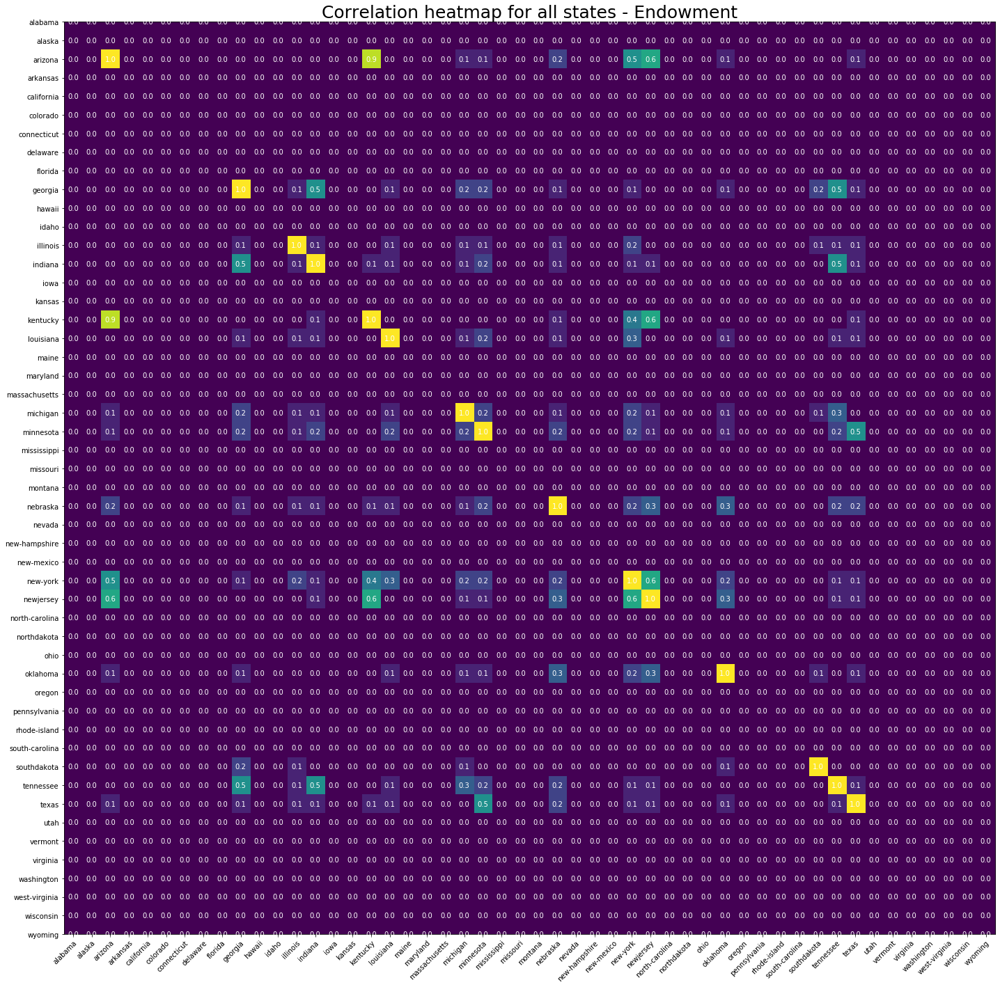

In [426]:
dict_data = getTopTenWordForEachState("Endowment")
correlation_matrix = createMatrix(dict_data)
plotData('Endowment')

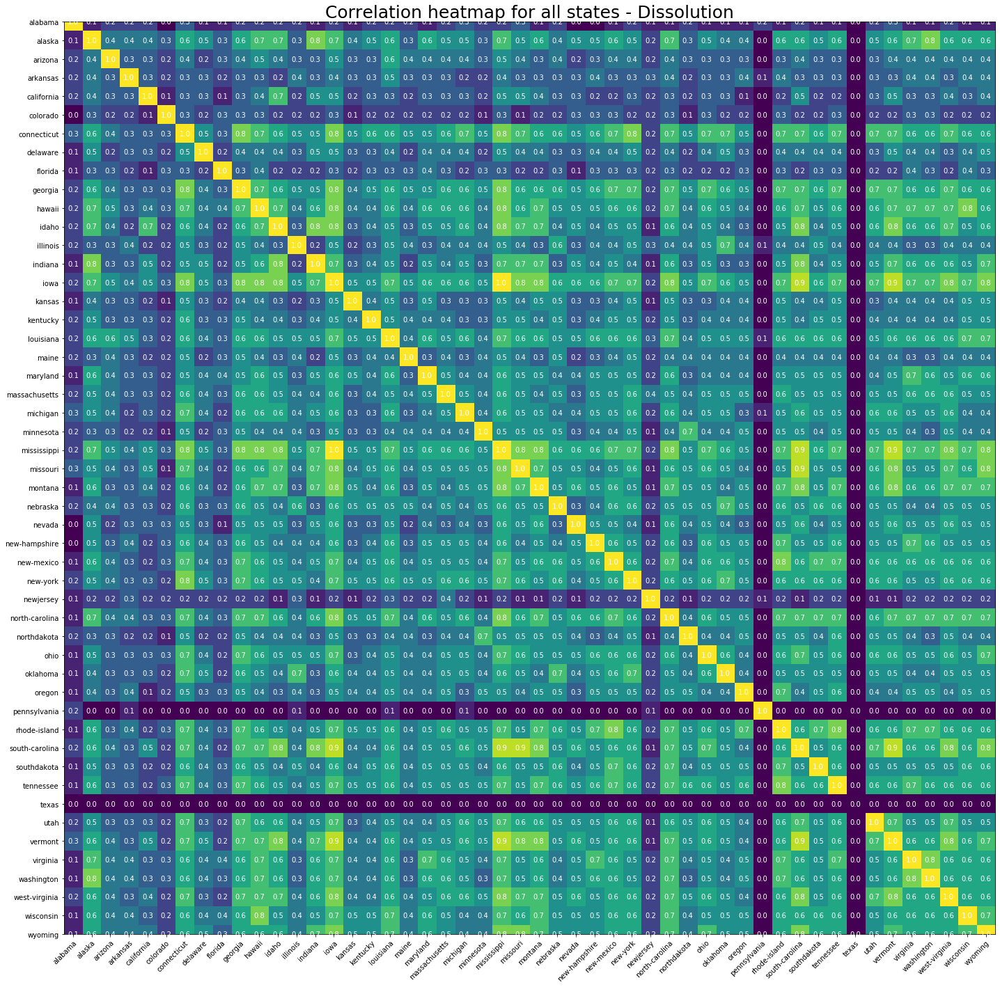

In [427]:
dict_data = getTopTenWordForEachState("Dissolution")
correlation_matrix = createMatrix(dict_data)
plotData('Dissolution')

# IV. Create Data Files


In [283]:
def mergedataclean(key_word):
    directory = 'C:\\Users\\hangl\\Documents\\Summer RA\\Non-profit\\Statues of States\\Data\\'
    entries = os.listdir(directory)
    key_word_df = pd.DataFrame(columns=['State','Law', key_word])
    for entry in entries:
        print(entry)
        if 'csv' in entry:
            state_name = pd.read_csv(directory + entry)
        elif 'tsv' in entry:
            state_name = pd.read_csv(directory + entry, delimiter="\t")
        else:
            print (false)
        state_name = state_name.rename(columns={'4':'Law'})
        state_name['State'] = entry.split('.')[0]
        key_word_df = key_word_df.append(state_name.loc[state_name[key_word] == True, ['State', 'Article','Law', key_word]])
        key_word_df['Law'] = key_word_df.Law.apply(fix_Text)
    return key_word_df

In [110]:
df = mergedataclean('Merger')
print(df)

alabama.csv
alaska.csv
arizona.csv
arkansas.tsv
california.csv
colorado.csv
connecticut.tsv
delaware.csv
florida.tsv
georgia.csv
hawaii.tsv
idaho.tsv
illinois.tsv
indiana.csv
iowa.csv
kansas.tsv
kentucky.csv
louisiana.tsv
maine.tsv
maryland.tsv
massachusetts.tsv
michigan.tsv
minnesota.tsv
mississippi.csv
missouri.tsv
montana.tsv
nebraska.tsv
nevada.tsv
new-hampshire.tsv
new-mexico.tsv
new-york.tsv
newjersey.tsv
north-carolina.csv
northdakota.csv
ohio.csv
oklahoma.csv
oregon.csv
pennsylvania.tsv
rhode-island.csv
south-carolina.csv
southdakota.tsv
tennessee.csv
texas.tsv
utah.tsv
vermont.tsv
virginia.tsv
washington.tsv
west-virginia.tsv
wisconsin.tsv
wyoming.tsv
                                               Article  \
4                   Section 10-3A-20 - General powers.   
40           Section 10-3A-100 - Procedure for merger.   
42   Section 10-3A-102 - Approval of merger or cons...   
43   Section 10-3A-103 - Articles of merger or cons...   
44   Section 10-3A-104 - Effect of merger

In [111]:
# Export to csv file
df.to_csv('Merger Clean Data - All States.csv', index= False)

In [4]:
def mergedata(key_word):
    directory = 'C:\\Users\\hangl\\Documents\\Summer RA\\Non-profit\\Statues of States\\Data\\'
    entries = os.listdir(directory)
    key_word_df = pd.DataFrame(columns=['State','Law', key_word])
    for entry in entries:
        print(entry)
        if 'csv' in entry:
            state_name = pd.read_csv(directory + entry)
        elif 'tsv' in entry:
            state_name = pd.read_csv(directory + entry, delimiter="\t")
        else:
            print (false)
        state_name = state_name.rename(columns={'4':'Law'})
        state_name['State'] = entry.split('.')[0]
        key_word_df = key_word_df.append(state_name.loc[state_name[key_word] == True, ['State', 'Article','Law', key_word]])
    #key_word_df['Law'] = key_word_df.Law.apply(fix_Text)
    return key_word_df

In [74]:
df_merger = mergedata('Merger')
print(df_merger)

alabama.csv
alaska.csv
arizona.csv
arkansas.tsv
california.csv
colorado.csv
connecticut.tsv
delaware.csv
florida.tsv
georgia.csv
hawaii.tsv
idaho.tsv
illinois.tsv
indiana.csv
iowa.csv
kansas.tsv
kentucky.csv
louisiana.tsv
maine.tsv
maryland.tsv
massachusetts.tsv
michigan.tsv
minnesota.tsv
mississippi.csv
missouri.tsv
montana.tsv
nebraska.tsv
nevada.tsv
new-hampshire.tsv
new-mexico.tsv
new-york.tsv
newjersey.tsv
north-carolina.csv
northdakota.csv
ohio.csv
oklahoma.csv
oregon.csv
pennsylvania.tsv
rhode-island.csv
south-carolina.csv
southdakota.tsv
tennessee.csv
texas.tsv
utah.tsv
vermont.tsv
virginia.tsv
washington.tsv
west-virginia.tsv
wisconsin.tsv
wyoming.tsv
                                               Article  \
4                   Section 10-3A-20 - General powers.   
40           Section 10-3A-100 - Procedure for merger.   
42   Section 10-3A-102 - Approval of merger or cons...   
43   Section 10-3A-103 - Articles of merger or cons...   
44   Section 10-3A-104 - Effect of merger

In [78]:
df_merger.State.value_counts()

southdakota       149
nebraska           86
oklahoma           77
louisiana          73
arizona            55
pennsylvania       46
illinois           46
michigan           34
missouri           29
new-york           23
virginia           23
utah               22
indiana            21
hawaii             21
north-carolina     21
south-carolina     19
alaska             19
wisconsin          19
iowa               19
wyoming            18
connecticut        18
maine              17
minnesota          17
montana            16
vermont            16
delaware           15
rhode-island       14
west-virginia      14
georgia            14
mississippi        14
ohio               13
tennessee          13
new-mexico         12
kansas             12
maryland           10
washington         10
idaho               9
oregon              9
florida             9
alabama             7
northdakota         7
massachusetts       6
kentucky            6
california          5
texas               3
new-hampsh

In [77]:
# Export to csv file
df_merger.to_csv('Merger Data - All States.csv', index= False)

In [90]:
df_Endowment.Law.isnull().sum()

0

# V. Filters 10 words before and after

In [159]:
df_merger = mergedata('Merger')

alabama.csv
alaska.csv
arizona.csv


C:\Users\hangl\Anaconda3\lib\site-packages\pandas\core\frame.py:7123: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


arkansas.tsv
california.csv
colorado.csv
connecticut.tsv
delaware.csv
florida.tsv
georgia.csv

C:\Users\hangl\Anaconda3\lib\site-packages\pandas\core\indexing.py:1418: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)



hawaii.tsv
idaho.tsv
illinois.tsv
indiana.csv
iowa.csv
kansas.tsv
kentucky.csv
louisiana.tsv
maine.tsv
maryland.tsv
massachusetts.tsv
michigan.tsv
minnesota.tsv
mississippi.csv
missouri.tsv
montana.tsv
nebraska.tsv
nevada.tsv
new-hampshire.tsv
new-mexico.tsv
new-york.tsv
newjersey.tsv
north-carolina.csv
northdakota.csv
ohio.csv
oklahoma.csv
oregon.csv
pennsylvania.tsv
rhode-island.csv
south-carolina.csv
southdakota.tsv
tennessee.csv
texas.tsv
utah.tsv
vermont.tsv
virginia.tsv
washington.tsv
west-virginia.tsv
wisconsin.tsv
wyoming.tsv


In [160]:
df_merger.shape

(1114, 4)

In [161]:
df_merger = df_merger.reset_index(drop=True)

In [289]:
df_merger.loc[17, 'Law']

'(a) Each domestic corporation shall comply with the provisions of this chapter with respect to the merger or consolidation of domestic corporations and each foreign corporation shall comply with the applicable provisions of the laws of the state under which it is organized. (b) If the surviving or new corporation is to be governed by the laws of a state other than this state, it shall comply with the provisions of this chapter with respect to foreign corporations if it is to transact business in this state and in every case it shall file with the commissioner (1) an agreement that it may be served with process in this state in a proceeding for the enforcement of an obligation of a domestic corporation which is a party to the merger or consolidation; (2) an irrevocable appointment of the commissioner as its agent to accept service of process in these proceedings.'

In [331]:
def FilterTopTen(df_merger):
    text = df_merger.Law
    text = text.lower();
    text = text.split('merger')
    arrayText =[]
    for i,txt in enumerate(text):
        if(i< len(text) - 1):
            leftWords = text[i].split(' ')
            rightWords = text[i+1].split(' ')
        
            leftIndex = 0
            rightIndex = len(rightWords) - 1
            if len(leftWords) - 1 > 10:
                leftIndex = len(leftWords) - 10
            if len(rightWords) - 1 > 10:
                rightIndex = 10
 
            leftWords = leftWords[leftIndex:len(leftWords)]
            rightWords = rightWords[0:rightIndex]
            leftWords = str(leftWords).replace("'","").replace(",","").replace("[","").replace("]","")
            rightWords = str(rightWords).replace("'","").replace(",","").replace("[","").replace("]","")
            arrayText.append(leftWords + ' merger ' + rightWords)
    return arrayText

In [332]:
df_merger['tenword'] = df_merger.apply(FilterTopTen , axis = 1)

In [341]:
df_merger.head(50)

,Article,Law,Merger,State,tenword
0,Section 10-3A-20 - General powers.,"Section 10-3A-20General powers. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§5.)",True,alabama,[]
1,Section 10-3A-100 - Procedure for merger.,"Section 10-3A-100Procedure for merger. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§41.)",True,alabama,[section 10-3a-100procedure for merger . all provisions of title 10 have been repealed or]
2,Section 10-3A-102 - Approval of merger or consolidation.,"Section 10-3A-102Approval of merger or consolidation. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§43.)",True,alabama,[section 10-3a-102approval of merger or consolidation. all provisions of title 10 have been]
3,Section 10-3A-103 - Articles of merger or consolidation.,"Section 10-3A-103Articles of merger or consolidation. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§44.)",True,alabama,[section 10-3a-103articles of merger or consolidation. all provisions of title 10 have been]
4,Section 10-3A-104 - Effect of merger or consolidation.,"Section 10-3A-104Effect of merger or consolidation. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§45.)",True,alabama,[section 10-3a-104effect of merger or consolidation. all provisions of title 10 have been]
5,Section 10-3A-105 - Merger or consolidation of domestic and foreign corporations.,"Section 10-3A-105Merger or consolidation of domestic and foreign corporations. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§46.)",True,alabama,[section 10-3a-105 merger or consolidation of domestic and foreign corporations. all provisions]
6,Section 10-3A-180 - Merger of foreign corporation authorized to conduct affairs in Alabama.,"Section 10-3A-180Merger of foreign corporation authorized to conduct affairs in Alabama. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§76.)",True,alabama,[section 10-3a-180 merger of foreign corporation authorized to conduct affairs in alabama.]
7,Sec. 10.20.016. Defense of ultra vires.,"(a) An act of a corporation and a conveyance or transfer of real or personal property to or by a corporation is not invalid because the corporation did not have capacity or power to perform the act or to convey or receive the property. However, lack of capacity or power may be asserted as provided in this section. (b) The assertion may be made in a proceeding by a member or director against the corporation to enjoin the performance of an act or the transfer of real or personal property by or to the corporation. If the unauthorized act or transfer sought to be enjoined is being or is to be performed or made under a contract to which the corporation is a party, the court may, if the parties to the contract are parties to the proceeding and if the court considers it equitable, set aside and enjoin the performance of the contract. In so doing the court may allow compensation to the corporation or to the other parties to the contract for the loss or damage sustained by either of them resulting from the action of the court in setting aside and enjoining the performance of the contract. The court may not award anticipated profits to be derived from the performance of the contract as a loss or damage sustained. (c) The assertion may be made in a proceeding by the corporation, whether acting directly or through a receiver, trustee, or other legal representative, or through members in a representative suit, against the incumb

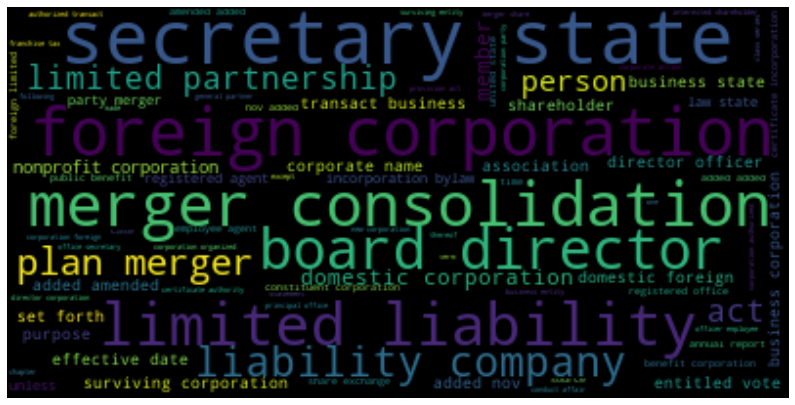

In [343]:
WordCloudAllState("Merger")

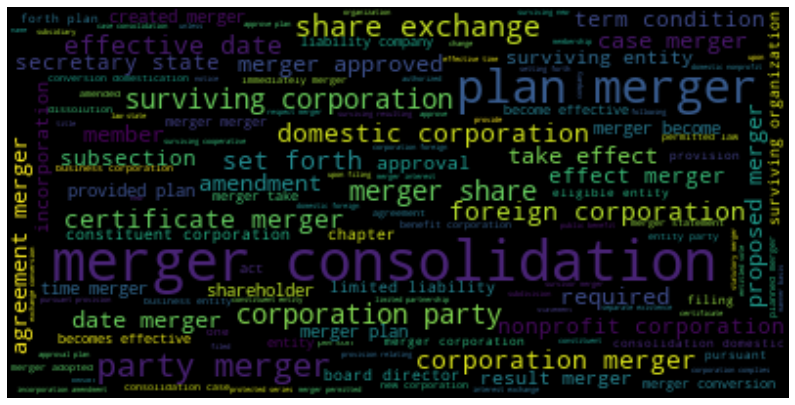

In [355]:
clean_text = df_merger.tenword.apply(fix_Text_wo_number)
text_wc = " ".join(item for item in clean_text)
wordcloud = WordCloud(background_color="black", max_words = 3000).generate(text_wc)
plt.figure(figsize = (14, 13))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show() 

In [387]:
def getTopWordAllStateNew(df_merger):
    clean_text = df_merger.tenword.apply(fix_Text_wo_number)
    text_wc = " ".join(item for item in clean_text)
    sort_orders = sorted(computeTF(text_wc).items(), key=lambda x: x[1], reverse = True)
    df = pd.DataFrame (sort_orders[:10],columns=['Word', 'Frequency'])
    array = df.Word
    return array

In [388]:
def getTopTenWordForEachStateNew(df_merger):
    dict_data = {}
    sort_orders = {}
    array = []
    #get 2 columns "state" + 'tenword'
    df_merger = df_merger.loc[:, ['State', 'tenword']]
    #groupby state
    df = df_merger.groupby('State')
    # apply clean_text on tenwords
    for group in df.groups:
        clean_text = df.get_group(group).tenword.apply(fix_Text_wo_number)
        text_wc = " ".join(item for item in clean_text)
        sort_orders = sorted(computeTF(text_wc).items(), key=lambda x: x[1], reverse = True)
        temp_df = pd.DataFrame (sort_orders[:10],columns=['Word', 'Frequency'])
        array = temp_df.Word
        dict_data.update({group:array})
    return dict_data

In [391]:
dict_data = getTopTenWordForEachStateNew(df_merger)
top_ten = getTopWordAllStateNew(df_merger)
dict_data_new ={}
for key in dict_data.keys():
        dict_data_new.update({key:compareTwoStates(dict_data[key],top_ten)})
df = pd.DataFrame(list(dict_data_new.items()),columns=['state','correlation'])
print(df)

             state  correlation
0   alabama         0.3        
1   alaska          0.6        
2   arizona         0.2        
3   california      0.1        
4   colorado        0.0        
5   connecticut     0.6        
6   delaware        0.4        
7   florida         0.5        
8   georgia         0.1        
9   hawaii          0.7        
10  idaho           0.3        
11  illinois        0.6        
12  indiana         0.4        
13  iowa            0.6        
14  kansas          0.3        
15  kentucky        0.5        
16  louisiana       0.7        
17  maine           0.5        
18  maryland        0.3        
19  massachusetts   0.3        
20  michigan        0.8        
21  minnesota       0.6        
22  mississippi     0.4        
23  missouri        0.5        
24  montana         0.4        
25  nebraska        0.6        
26  nevada          0.4        
27  new-hampshire   0.3        
28  new-mexico      0.6        
29  new-york        0.6        
30  newj

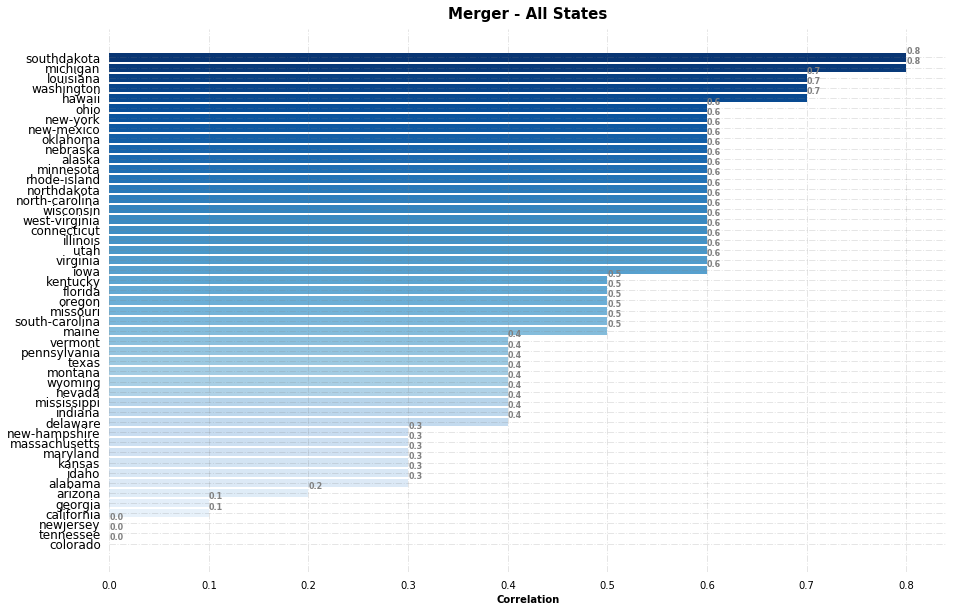

In [392]:
fig, ax = plt.subplots(figsize=(15,10))

# Horizontal Bar Plot

#title_cnt=dt.city.value_counts().sort_values(ascending=False).reset_index()
df.sort_values('correlation',ascending=False, inplace=True)
mn= ax.barh(df.iloc[:,0], df.iloc[:,1], color=sns.color_palette('Blues_r',len(df)))

# Remove axes splines
for s in ['top','bottom','left','right']:
    ax.spines[s].set_visible(False)

# Remove x,y Ticks
ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')

# Add padding between axes and labels
ax.xaxis.set_tick_params(pad=5)
ax.yaxis.set_tick_params(pad=5)

# Add x,y gridlines
ax.grid(b=True, color='grey', linestyle='-.', linewidth=1, alpha=0.2)

# Show top values 
ax.invert_yaxis()

# Add Plot Title
ax.set_title('Merger - All States',weight='bold',
             loc='center', pad=10, fontsize=15)
ax.set_xlabel('Correlation', weight='bold')


# Add annotation to bars
for i in ax.patches:
    ax.text(i.get_width(), i.get_y(), str(round((i.get_width()), 2)),
            fontsize=8, fontweight='bold', color='grey')
plt.yticks(fontsize=12)


plt.show()
# Show Plot
plt.show()

## VI. Find Keyword in the first 10 words

In [394]:
def FindWord(df_merger):
    text = df_merger.Law
    text = text.lower();
    text = text.split('merger')
    text_before_merger = text[0].split(' ')
    if len(text_before_merger) > 10 :
        #merger was in someplace at the end of law
        return 0
    #merger was in someplace at the begining of law (first 10 words)
    return 1

In [395]:
df_merger['Merger_Position'] = df_merger.apply(FindWord, axis = 1)

In [397]:
df_merger.head(20)

,Article,Law,Merger,State,tenword,Merger_Position
0,Section 10-3A-20 - General powers.,"Section 10-3A-20General powers. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§5.)",True,alabama,[],0
1,Section 10-3A-100 - Procedure for merger.,"Section 10-3A-100Procedure for merger. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§41.)",True,alabama,[section 10-3a-100procedure for merger . all provisions of title 10 have been repealed or],1
2,Section 10-3A-102 - Approval of merger or consolidation.,"Section 10-3A-102Approval of merger or consolidation. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§43.)",True,alabama,[section 10-3a-102approval of merger or consolidation. all provisions of title 10 have been],1
3,Section 10-3A-103 - Articles of merger or consolidation.,"Section 10-3A-103Articles of merger or consolidation. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§44.)",True,alabama,[section 10-3a-103articles of merger or consolidation. all provisions of title 10 have been],1
4,Section 10-3A-104 - Effect of merger or consolidation.,"Section 10-3A-104Effect of merger or consolidation. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§45.)",True,alabama,[section 10-3a-104effect of merger or consolidation. all provisions of title 10 have been],1
5,Section 10-3A-105 - Merger or consolidation of domestic and foreign corporations.,"Section 10-3A-105Merger or consolidation of domestic and foreign corporations. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§46.)",True,alabama,[section 10-3a-105 merger or consolidation of domestic and foreign corporations. all provisions],1
6,Section 10-3A-180 - Merger of foreign corporation authorized to conduct affairs in Alabama.,"Section 10-3A-180Merger of foreign corporation authorized to conduct affairs in Alabama. All provisions of Title 10 have been repealed or transferred to Title 10A, effective January 1, 2011. (Acts 1984, No. 84-290, p. 502, Â§76.)",True,alabama,[section 10-3a-180 merger of foreign corporation authorized to conduct affairs in alabama.],1
7,Sec. 10.20.016. Defense of ultra vires.,"(a) An act of a corporation and a conveyance or transfer of real or personal property to or by a corporation is not invalid because the corporation did not have capacity or power to perform the act or to convey or receive the property. However, lack of capacity or power may be asserted as provided in this section. (b) The assertion may be made in a proceeding by a member or director against the corporation to enjoin the performance of an act or the transfer of real or personal property by or to the corporation. If the unauthorized act or transfer sought to be enjoined is being or is to be performed or made under a contract to which the corporation is a party, the court may, if the parties to the contract are parties to the proceeding and if the court considers it equitable, set aside and enjoin the performance of the contract. In so doing the court may allow compensation to the corporation or to the other parties to the contract for the loss or damage sustained by either of them resulting from the action of the court in setting aside and enjoining the performance of the contract. The court may not award anticipated profits to be derived from the performance of the contract as a loss or damage sustained. (c) The assertion may be made in a proceeding by the corporation, whether acting directly or through a receiver, trustee, or other legal representative, or through members in a represent

## VI. N-Gram words association compare

In [171]:
# Sec. 10.20.236. Adoption of plan of merger or consolidation - Alaska
text = df_merger.loc[[10], ['Law']]
print(text)

In [130]:
vectorizer = CountVectorizer(binary=True, ngram_range=(6,6))

In [172]:
vectorizer.fit(text.Law)

CountVectorizer(analyzer='word', binary=True, decode_error='strict',
                dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
                lowercase=True, max_df=1.0, max_features=None, min_df=1,
                ngram_range=(6, 6), preprocessor=None, stop_words=None,
                strip_accents=None, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, vocabulary=None)

In [183]:
vectorizer.get_feature_names()[:200]

['adopt resolution approving the proposed plan',
 'adopted at meeting of the board',
 'adopted in the manner set out',
 'adopted upon receiving at least two',
 'an annual or special meeting written',
 'and directing that it be submitted',
 'and in the manner provided in',
 'annual or special meeting written notice',
 'approving the proposed plan and directing',
 'are entitled to cast if merging',
 'are entitled to vote the board',
 'at least two thirds of the',
 'at meeting of members entitled to',
 'at meeting of the board of',
 'at the meeting or represented by',
 'at the meeting within the time',
 'be adopted at meeting of the',
 'be adopted in the manner set',
 'be adopted upon receiving at least',
 'be either an annual or special',
 'be given to each member entitled',
 'be submitted to vote at meeting',
 'board of directors of the corporation',
 'by proxy are entitled to cast',
 'cast if merging or consolidating corporation',
 'chapter for the giving of notice',
 'consolidating co

In [174]:
matrix = vectorizer.transform(df_merger.Law)
sums = matrix.sum(axis=1)
sums[:10]

matrix([[0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [2],
        [0]], dtype=int64)

In [164]:
df_merger['Article'] = df_merger['Article'].astype(str)

In [176]:
pd.DataFrame({
    'matches': np.squeeze(np.asarray(sums)),
    'Law': df_merger.Law,
    'Code': df_merger.State + "-" + df_merger.Article
}).sort_values(by='matches', ascending=False).head(10)

matches  \
10    169       
588   115       
799   112       
272   100       
355   93        
1057  90        
197   58        
930   48        
13    29        
932   26        

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

In [177]:
word_counts = pd.DataFrame(
    matrix.toarray(), 
    columns=vectorizer.get_feature_names(),
    index= df_merger.State + "-" + df_merger.Article
)

word_counts = word_counts.loc[~(word_counts==0).all(axis=1)]

word_counts = word_counts.replace(0, np.nan) \
    .dropna(axis=1, how='all') \
    .dropna(axis=0, how='all')

word_counts['TOTAL_ngrams_shared'] = word_counts.sum(axis=1)
word_counts = word_counts.sort_values(by='TOTAL_ngrams_shared', ascending=False)
word_counts = word_counts.T

word_counts['TOTAL_bills_used'] = word_counts.sum(axis=1)
word_counts = word_counts.sort_values(by='TOTAL_bills_used', ascending=False)

word_counts.fillna("", inplace=True)

In [178]:
word_counts.head(200)

,alaska-Sec. 10.20.236. Adoption of plan of merger or consolidation.,new-mexico-Section 53-8-42 - Adoption of merger or consolidation.,rhode-island-Section 7-6-45 Approval of merger or consolidation.,kentucky-kentucky_statutes_273-283,maine-13-B §903. Approval of merger or consolidation,washington-24.03.195 Approval of merger or consolidation.,illinois-Article 2 - Nature Of Partnership,southdakota-§ 47-25-8 Corporations having no members entitled to vote--Approval by directors.,alaska-Sec. 10.20.251. Contents of articles of merger or consolidation.,southdakota-§ 47-25-10 Approval of articles of merger or consolidation--Contents of approval--Delivery to secretary of state.,new-mexico-Section 53-8-43 - Articles of merger or consolidation.,kentucky-kentucky_statutes_273-287,rhode-island-Section 7-6-46 Articles of merger or consolidation.,illinois-Article 8 - Directors And Officers,southdakota-§ 47-25-12 Effective date of merger or consolidation.,maine-13-B §904. Articles of merger or consolidation,illinois-Article 25 - Distributions,washington-24.03.200 Articles of merger or consolidation.,virginia-§ 13.1-895. Action on plan of merger,minnesota-Section 317A.613 — Plan Approval.,"michigan-Section 450.2753 Disposition of Property and Assets of Corporation; Disposal of All or Substantially All of Property; Presumption That Corporation Retains Significant Continuing Business Activity; ""Consideration"" Defined; Recommendation of Proposed Transaction; Exceptions; Submission to Shareholders or Members; Approval; Notice of Meeting; Statement; Authorization; Fixing Term or Condition and Consideration; Voting; Abandonment; Distribution.",michigan-Section 450.2703a Plan of Merger; Approval.,southdakota-§ 47-25-9 Abandonment of merger or consolidation plan.,minnesota-Section 317A.621 — Merger Of Wholly Owned Subsidiaries.,west-virginia-§31E-11-1102. Action on Plan of Merger,connecticut-Section 33-1156 - Action on plan of merger.,louisiana-RS 12:243 - Merger or consolidation procedure,southdakota-§ 47-25-7 Two-thirds vote required for approval.,illinois-Article 2 - Formation of Benefit Corporations,illinois-Article 55 - Miscellaneous,new-york-903 - Approval of Plan.,virginia-§ 13.1-896. Articles of merger,illinois-Article 5 - Office And Agent,texas-Section 22.164. Vote Required to Approve Fundamental Action,illinois-Article 4 - Name,illinois-Article 3 - Corporate Purposes,texas-Section 22.253. Meeting of Members; Notice,alaska-Sec. 10.20.241. Abandonment of plan of merger or consolidation.,louisiana-RS 12:1805 - Termination of status,illinois-Article 50 - Fees And Other Matters,illinois-Article 5 - Office And Agent,arizona-§ 10-11103 Action on plan,oklahoma-§18-1090.3. Business combinations with interested shareholders.,louisiana-RS 12:1804 - Election of status; corporate name,north-carolina-§ 55A-3-03 - Emergency powers.,new-mexico-Section 53-8-44 - Effect of merger or consolidation.,"nebraska-21-29,124 Approval or abandonment of merger or consolidation by members of constituent limited cooperative association.",mississippi-§ 79-11-153. Emergency powers of board of directors; notice during emergency; officers may be deemed directors during emergency; effect of emergency corporate action; emergency defined,nebraska-21-1929 Emergency powers.,"nebraska-21-29,123 Notice and action on plan of merger or consolidation by constituent limited cooperative association.","nebraska-21-29,122 Merger or consolidation.",missouri-Section 355.136 Emergency powers.,nebraska-21-228 Emergency powers.,alaska-Sec. 10.20.216. Merger.,ohio-Section 1702.41 - Merger or consolidation into domestic corporation.,tennessee-§ 48-53-103. Emergency powers.,wyoming-Section 17-19-303 - Emergency Powers.,west-virginia-§31E-3-303. Emergency Powers,washington-24.03.210 Effect of merger or consolidation.,washington-24.03.185 Procedure for merger.,virginia-§ 13.1-894. Merger,virginia-§ 13.1-827. Emergency powers,utah-Section 1102 - Action on plan of merger.,utah-Section 303 - Emer

## VII. Topic Modelling

In [213]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer 
from sklearn.feature_extraction.text import TfidfVectorizer 

# We just want yes/no for our words, so we use binary=True
vectorizer = CountVectorizer(binary=True)
# Later, try uncommenting this line and see what happens to the chart below!
# vectorizer = TfidfVectorizer(use_idf=False)
clean =  df_merger.Law.apply(fix_Text_wo_number)
print(clean)
# sentences = clean.split(' ')
matrix = vectorizer.fit_transform(clean)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [210]:
from sklearn.feature_extraction.text import CountVectorizer

stemmer = nltk.stem.SnowballStemmer('english')

analyzer = CountVectorizer().build_analyzer()

class StemmedCountVectorizer(CountVectorizer):
    def build_analyzer(self):
        analyzer = super(CountVectorizer, self).build_analyzer()
        #return lambda doc: stemmer.stem(analyzer(doc))
        return stemmer.stem(analyzer('school'))

vectorizer = StemmedCountVectorizer(max_features=10000, max_df=0.25)
matrix = vectorizer.fit_transform('school')

ValueError: Iterable over raw text documents expected, string object received.

In [217]:
%%time
from sklearn.model_selection import GridSearchCV

# Define Search Param
search_params = {'n_components': [5, 10, 20, 30], 'learning_decay': [.5, .7, .9]}

# Init the Model
lda = LatentDirichletAllocation(learning_method='online')

# Init Grid Search Class
gridsearch = GridSearchCV(lda, param_grid=search_params, cv=5, n_jobs=-1, verbose=1)

# Do the Grid Search
gridsearch.fit(matrix)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  35 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  36 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  39 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  41 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  43 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:  1.0min


KeyboardInterrupt: 

In [218]:
# Model Parameters
print("Best Model's Params: ", gridsearch.best_params_)

# Log Likelihood Score
print("Best Log Likelihood Score: ", gridsearch.best_score_)

AttributeError: 'GridSearchCV' object has no attribute 'best_params_'

In [215]:
%%time
from sklearn.decomposition import LatentDirichletAllocation

lda = LatentDirichletAllocation(n_components=30, learning_method='online')
lda.fit_transform(matrix)

Wall time: 6.53 s


array([[3.03030303e-03, 3.03030303e-03, 3.03030303e-03, ...,
        3.03030303e-03, 3.03030303e-03, 3.03030303e-03],
       [3.03030303e-03, 3.03030303e-03, 3.03030303e-03, ...,
        3.03030303e-03, 3.03030303e-03, 3.03030303e-03],
       [2.77777778e-03, 2.77777778e-03, 2.77777778e-03, ...,
        2.77777778e-03, 2.77777778e-03, 2.77777778e-03],
       ...,
       [1.75438596e-03, 1.75438596e-03, 1.75438596e-03, ...,
        4.32658619e-01, 1.75438596e-03, 1.75438596e-03],
       [4.69483568e-04, 4.69483568e-04, 4.69483568e-04, ...,
        4.69483568e-04, 4.69483568e-04, 4.69483568e-04],
       [2.73224044e-04, 2.73224044e-04, 2.73224044e-04, ...,
        2.73224044e-04, 2.73224044e-04, 2.73224044e-04]])

In [216]:
# Best Model
best_lda_model = model.best_estimator_

# Model Parameters
print("Best Model's Params: ", model.best_params_)

# Log Likelihood Score
print("Best Log Likelihood Score: ", model.best_score_)

# Perplexity
print("Model Perplexity: ", best_lda_model.perplexity(matrix))

NameError: name 'model' is not defined

In [219]:
n_words = 5
feature_names = vectorizer.get_feature_names()

for topic_idx, topic in enumerate(lda.components_):
    message = "Topic #%d: " % topic_idx
    message += " ".join([feature_names[i]
                         for i in topic.argsort()[:-n_words - 1:-1]])
    print(message)
print()

AttributeError: 'LatentDirichletAllocation' object has no attribute 'components_'